<h1>Terrain Price in Buenos Aires</h1>

<p>The website of the Buenos Aires Autonomous City has datasets with the information of the terrains for sale, year by year. To have an idea of what we can gather from these datasets, I thought about creating some visualizations.</p>
<p>It would be interesting to know whether or not the pricing has gone up or down in US dollars, regardless of the devaluation of the Argentinian Peso across time and which comunes or barrios have seen the biggest growth in price of the squared meter.</p>

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib as mpl
import seaborn as sns
import datetime as dt

%matplotlib notebook

plt.style.use('default')
mpl.rcParams['figure.figsize'] = (10, 10)

In [2]:
#Open the csv files with the terrains data

terrains2001 = pd.read_csv('precio-de-terrenos-2001.csv', sep=';', thousands=',')
terrains2002 = pd.read_csv('precio-de-terrenos-2002.csv', sep=';', thousands=',')
terrains2003 = pd.read_csv('precio-de-terrenos-2003.csv', sep=';', thousands=',')
terrains2004 = pd.read_csv('precio-de-terrenos-2004.csv', sep=';', thousands=',')
terrains2005 = pd.read_csv('precio-de-terrenos-2005.csv', sep=';', thousands=',')
terrains2006 = pd.read_csv('precio-de-terrenos-2006.csv', sep=';', thousands=',')
terrains2007 = pd.read_csv('precio-de-terrenos-2007.csv', sep=';', thousands=',')
terrains2008 = pd.read_csv('precio-de-terrenos-2008.csv', sep=';', thousands=',')
terrains2009 = pd.read_csv('precio-de-terrenos-2009.csv', sep=';', thousands=',')
terrains2010 = pd.read_csv('precio-de-terrenos-2010.csv', sep=';', thousands=',')
terrains2011 = pd.read_csv('precio-de-terrenos-2011.csv', sep=';', thousands=',')
terrains2012 = pd.read_csv('precio-de-terrenos-2012.csv', sep=';', thousands=',')
terrains2013 = pd.read_csv('precio-de-terrenos-2013.csv', sep=';', thousands=',')
terrains2014 = pd.read_csv('precio-de-terrenos-2014.csv', sep=';')
terrains2015 = pd.read_csv('precio-de-terrenos-2015.csv', sep=';')

#2015 Does not have a date column
terrains2015['Date'] = pd.to_datetime('2015/06/01', format='%Y/%m/%d')
terrains2016 = pd.read_csv('precio-de-terrenos-2016.csv', decimal=',', sep=';')

#2016 has empty values with a single space for the Date column
terrains2016['FECHA'] = (terrains2016['FECHA'].apply(lambda x: str(x.replace(' ', '12/29/2016'))))
terrains2017 = pd.read_csv('precio-de-terrenos-2017.csv', decimal=',', sep=';')
terrains2018 = pd.read_csv('precio-de-terrenos-2018.csv', thousands=',')

#2018 does not have a date column
terrains2018['Date'] = pd.to_datetime('2018/06/01', format='%Y/%m/%d')


In [3]:
terrains2014

,X,Y,FECHA,CALLE,NUMERO,M2,DOLARES,PESOS,U_S_M2,BARRIOS,COMUNA
0,-58.455627,-34.553169,2015/02/19,11 DE SEPTIEMBRE DE 1888,2700,381.0,1150000,NaN,3018.4,BELGRANO,13
1,-58.457136,-34.551182,2015/02/13,11 DE SEPTIEMBRE DE 1888,2900,200.0,360000,NaN,1800.0,NUÑEZ,13
2,-58.462965,-34.543213,2015/02/19,11 DE SEPTIEMBRE DE 1888,3900,493.0,1000000,NaN,2028.4,NUÑEZ,13
3,-58.464855,-34.588766,NaN,14 DE JULIO,400,400.0,270000,NaN,675.0,CHACARITA,15
4,-58.464855,-34.588766,2015/02/20,14 DE JULIO,400,310.0,270000,NaN,871.0,CHACARITA,15
5,-58.382662,-34.630725,2015/02/18,15 DE NOVIEMBRE DE 1889,1200,350.0,750000,NaN,2142.9,CONSTITUCION,1
6,-58.411316,-34.615329,2015/02/13,24 DE NOVIEMBRE,400,301.0,264000,NaN,877.1,BALVANERA,3
7,-58.410033,-34.629892,2015/02/19,24 DE NOVIEMBRE,1600,130.0,280000,NaN,2153.8,SAN CRISTOBAL,3
8,-58.409432,-34.635447,2015/02/19,24 DE NOVIEMBRE,2100,2500.0,3700000,NaN,1480.0,PARQUE PATRICIOS,4
9,-58.416831,-34.659151,2015/02/20,27 DE FEBRERO,5000,3900.0,2000000,NaN,512.8,NUEVA POMPEYA,4


In [4]:
terrains2018

,operacion,tipo,long,lat,m2total,direccion,calle,altura,cambio,preciotex,preciousd,precioars,preciousdm,precioarsm,barrio,comuna,codigo_postal,codigo_postal_argentino,Date
0,VTA,TERRENO,-58.414071,-34.618214,320.0,Agrelo 3399,Agrelo,3399.0,37.2,U$S 330000,330000.0,12276000.0,1031.250000,38362.500000,ALMAGRO,5.0,1224.0,C1224ABE,2018-06-01
1,VTA,TERRENO,-58.424566,-34.610097,320.0,Bartolome Mitre y Gascon,Bartolome Mitre y Gascon,NaN,37.2,U$S 690000,690000.0,25668000.0,2156.250000,80212.500000,ALMAGRO,5.0,NaN,NaN,2018-06-01
2,VTA,TERRENO,-58.424486,-34.613659,174.0,Don Bosco,Don Bosco,NaN,37.2,U$S 380000,380000.0,14136000.0,2183.908046,81241.379310,ALMAGRO,5.0,NaN,NaN,2018-06-01
3,VTA,TERRENO,-58.423651,-34.614752,650.0,Hipolito Irigoyen 4043,Hipolito Irigoyen,4043.0,37.2,U$S 1000000,1000000.0,37200000.0,1538.461538,57230.769231,ALMAGRO,5.0,NaN,NaN,2018-06-01
4,VTA,TERRENO,-58.413725,-34.603124,283.0,HUMAHUACA 3400,HUMAHUACA,3400.0,37.2,U$S 850000,850000.0,31620000.0,3003.533569,111731.448763,ALMAGRO,5.0,1191.0,C1191ABB,2018-06-01
5,VTA,TERRENO,-58.421962,-34.607290,296.0,POTOSI 3900,POTOSI,3900.0,37.2,U$S 750000,750000.0,27900000.0,2533.783784,94256.756757,ALMAGRO,5.0,1199.0,C1199ACD,2018-06-01
6,VTA,TERRENO,-58.426717,-34.612694,240.0,PRIGLES,PRIGLES,NaN,37.2,U$S 448000,448000.0,16665600.0,1866.666667,69440.000000,ALMAGRO,5.0,NaN,NaN,2018-06-01
7,VTA,TERRENO,-58.427137,-34.602571,270.0,PRINGLES,PRINGLES,NaN,37.2,U$S 700000,700000.0,26040000.0,2592.592593,96444.444444,ALMAGRO,5.0,NaN,NaN,2018-06-01
8,VTA,TERRENO,-58.414019,-34.599348,176.0,San Luis 3438,San Luis,3438.0,37.2,U$S 589000,589000.0,21910800.0,3346.590909,124493.181818,ALMAGRO,5.0,1186.0,C1186ACP,2018-06-01
9,VTA,TERRENO,-58.414043,-34.601189,221.0,SANCHEZ DE BUSTAMANTE 800,SANCHEZ DE BUSTAMANTE,800.0,37.2,U$S 500000,500000.0,18600000.0,2262.443439,84162.895928,ALMAGRO,5.0,1173.0,C1173ABN,2018-06-01


In [5]:
#This function will clean the dataframes and return it with renamed columns

def cleanData(df):

        #First, we checked all the csv files for the column names used and created a dictionary to unify them
    
        columnNames = {'barrio': 'Location', 'fecha': 'Date', 'dolares': 'Value in US Dollars', 
                      'u_s_m2': 'Value of m2 (US Dollars)', 'BARRIOS': 'Location', 'FECHA': 'Date', 
                       'DOLARES': 'Value in US Dollars', 'U_S_M2': 'Value of m2 (US Dollars)', 'M2': 'm2',
                       'BARRIO': 'Location', 'PRECIOUSD': 'Value in US Dollars', 'PRECIOUSDM': 'Value of m2 (US Dollars)',
                       'M2TOTAL': 'm2', 'm2total': 'm2', 'preciousd': 'Value in US Dollars', 
                       'preciousdm': 'Value of m2 (US Dollars)', 'lat':'Latitude', 'LAT': 'Latitude',
                       'long': 'Longitude', 'LON': 'Longitude', 'latitud': 'Latitude', 'longitud': 'Longitude',
                       'LATITUD': 'Latitude', 'LONGITUD': 'Longitude', 'X': 'Latitude', 'Y': 'Longitude'}
        
        #Then, delete empty rows, rename the columns and set the index for the Location (Name of the Barrio)
        df = (df.dropna()
            .rename(columns=columnNames)
            .set_index('Location'))
        
        #With the following line, we indicate that we only wish to keep the columns below, then the rest can be deleted
        df = df[['Date', 'Value in US Dollars', 'Value of m2 (US Dollars)', 'm2', 'Latitude', 'Longitude']]
        
        #Since some of the date columns are a String datatype, this sets them as datetime type.
        df['Date'] = pd.to_datetime(df['Date'])
        
        #This is to unify the format of the date column so that all dataframes are the same
        df['Date'] = df['Date'].dt.strftime('%Y/%m/%d')
        
        #Unify the Data type for the column 'Value of m2 (US Dollars)' to float. This will allow to perform operations later.
        df['Value of m2 (US Dollars)'] = df['Value of m2 (US Dollars)'].astype(float)
        df['Value in US Dollars'] = df['Value of m2 (US Dollars)'] * df['m2']
        return df

In [6]:
#Here we create the individual dataframes for each year

terrains2001 = cleanData(terrains2001)
terrains2002 = cleanData(terrains2002)
terrains2003 = cleanData(terrains2003)
terrains2004 = cleanData(terrains2004)
terrains2005 = cleanData(terrains2005)
terrains2006 = cleanData(terrains2006)
terrains2007 = cleanData(terrains2007)
terrains2008 = cleanData(terrains2008)
terrains2009 = cleanData(terrains2009)
terrains2010 = cleanData(terrains2010)
terrains2011 = cleanData(terrains2011)
terrains2012 = cleanData(terrains2012)
terrains2013 = cleanData(terrains2013)
terrains2014 = cleanData(terrains2014)
terrains2015 = cleanData(terrains2015)
terrains2016 = cleanData(terrains2016)
terrains2017 = cleanData(terrains2017)
terrains2018 = cleanData(terrains2018)

In [7]:
terrains2018.head()

,Date,Value in US Dollars,Value of m2 (US Dollars),m2,Latitude,Longitude
Location,,,,,,
ALMAGRO,2018/06/01,330000.000000,1031.250000,320.0,-34.618214,-58.414071
ALMAGRO,2018/06/01,850000.000027,3003.533569,283.0,-34.603124,-58.413725
ALMAGRO,2018/06/01,750000.000064,2533.783784,296.0,-34.607290,-58.421962
ALMAGRO,2018/06/01,588999.999984,3346.590909,176.0,-34.599348,-58.414019
ALMAGRO,2018/06/01,500000.000019,2262.443439,221.0,-34.601189,-58.414043


In [8]:
#Here we merge them into a single Dataframe that contains all the data

frames = [terrains2001, terrains2002, terrains2003, terrains2004, terrains2005, terrains2006, terrains2007, terrains2008,
          terrains2009, terrains2010, terrains2011, terrains2012, terrains2013, terrains2015, terrains2016, terrains2017,
         terrains2018]

df = pd.concat(frames)

In [9]:
#first year 2001
df.head()

,Date,Value in US Dollars,Value of m2 (US Dollars),m2,Latitude,Longitude
Location,,,,,,
PALERMO,2001/12/10,720000.0,2400.0,300.0,-34.5695,-58.4413
BELGRANO,2001/12/10,729975.0,973.3,750.0,-34.5579,-58.4521
BELGRANO,2001/12/10,650032.5,847.5,767.0,-34.5577,-58.4523
NUÑEZ,2001/12/10,369991.2,994.6,372.0,-34.5374,-58.4677
VILLA ORTUZAR,2001/12/10,94005.7,676.3,139.0,-34.5783,-58.462


In [10]:
#and 2018 at the end
df.tail()

,Date,Value in US Dollars,Value of m2 (US Dollars),m2,Latitude,Longitude
Location,,,,,,
SAAVEDRA,2018/06/01,7.700000e+05,3130.081301,246.0,-34.555,-58.4814
VILLA LURO,2018/06/01,3.900000e+05,791.075051,493.0,-34.6422,-58.4925
FLORES,2018/06/01,1.470000e+06,2611.012433,563.0,-34.6287,-58.4673
FLORES,2018/06/01,1.400000e+06,2451.838879,571.0,-34.6288,-58.4682
COGHLAN,2018/06/01,1.300000e+06,1675.257732,776.0,-34.5546,-58.4728


In [11]:
#Since the index is the barrio name, we will find them all and check for any incorrect values 
df.index.unique()

Index(['PALERMO', 'BELGRANO', 'NUÑEZ', 'VILLA ORTUZAR', 'BALVANERA',
       'SAN CRISTOBAL', 'VILLA CRESPO', 'VILLA GENERAL MITRE', 'FLORESTA',
       'PARQUE CHACABUCO', 'PARQUE AVELLANEDA', 'CABALLITO', 'ALMAGRO',
       'POMPEYA', 'VILLA URQUIZA', 'SAAVEDRA', 'VILLA PUYRREDON', 'VILLA LURO',
       'MATADEROS', 'FLORES', 'VERSAILLES', 'LINIERS', 'VELEZ SARFIELD',
       'VILLA DEVOTO', 'BOCA', 'AGRONOMIA', 'CHACARITA', 'PATERNAL',
       'COLEGIALES', 'VILLA DEL PARQUE', 'VILLA LUGANO', 'VILLA SANTA RITA',
       'BARRACAS', 'MONTE CASTRO', 'VILLA RIACHUELO', 'RETIRO', 'MONSERRAT',
       'VILLA SOLDATI', 'CONSTITUCION', 'BOEDO', 'PARQUE PATRICIOS',
       'SAN TELMO', 'GOGHLAND', 'SAN NICOLAS', 'RECOLETA', 'VILLA REAL',
       'VILLA PUEYRREDON', 'VILLA GRAL. MITRE', 'VELEZ SARSFIELD',
       'NUEVA POMPEYA', 'PARQUE CHAS', 'VERSALLES', 'COGHLAN', 'PUERTO MADERO',
       'MONTSERRAT', 'PARQUE AVELLANED', 'NUNEZ', 'VILLA GRAL. MITR',
       'VILLA GRAL MITRE', 'NU?ÆEZ', 'NUÃ‘EZ', 'N

In [12]:
#Some of the names are incorrect, so we need to change them

df.reset_index(inplace=True)
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('NUNEZ', 'NUÑEZ'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('NU?ÆEZ', 'NUÑEZ'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('NU?EZ', 'NUÑEZ'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('NUâ”œÃ¦EZ', 'NUÑEZ'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('NUÃ‘EZ', 'NUÑEZ'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('GOGHLAND', 'COGHLAN'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('PARQUE AVELLANED', 'PARQUE AVELLANEDA'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('PARQUE AVELLANEDAA', 'PARQUE AVELLANEDA'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('SARSFIELD', 'SARFIELD'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('VILLA GRAL. MITRE', 'VILLA GENERAL MITRE'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('VILLA GRAL. MITR', 'VILLA GENERAL MITRE'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('VILLA GRAL MITRE', 'VILLA GENERAL MITRE'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('VILLA PUYRREDON', 'VILLA PUEYRREDON'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('VERSALLES', 'VERSAILLES'))))
df['Location'] = (df['Location'].apply(lambda x: str(x.replace('MONSERRAT', 'MONTSERRAT'))))

In [13]:
#Let's make sure they are correct

df['Location'].unique()

array(['PALERMO', 'BELGRANO', 'NUÑEZ', 'VILLA ORTUZAR', 'BALVANERA',
       'SAN CRISTOBAL', 'VILLA CRESPO', 'VILLA GENERAL MITRE', 'FLORESTA',
       'PARQUE CHACABUCO', 'PARQUE AVELLANEDA', 'CABALLITO', 'ALMAGRO',
       'POMPEYA', 'VILLA URQUIZA', 'SAAVEDRA', 'VILLA PUEYRREDON',
       'VILLA LURO', 'MATADEROS', 'FLORES', 'VERSAILLES', 'LINIERS',
       'VELEZ SARFIELD', 'VILLA DEVOTO', 'BOCA', 'AGRONOMIA', 'CHACARITA',
       'PATERNAL', 'COLEGIALES', 'VILLA DEL PARQUE', 'VILLA LUGANO',
       'VILLA SANTA RITA', 'BARRACAS', 'MONTE CASTRO', 'VILLA RIACHUELO',
       'RETIRO', 'MONTSERRAT', 'VILLA SOLDATI', 'CONSTITUCION', 'BOEDO',
       'PARQUE PATRICIOS', 'SAN TELMO', 'COGHLAN', 'SAN NICOLAS',
       'RECOLETA', 'VILLA REAL', 'NUEVA POMPEYA', 'PARQUE CHAS',
       'PUERTO MADERO'], dtype=object)

In [14]:
#Our new dataframe looks like this
df.head()

,Location,Date,Value in US Dollars,Value of m2 (US Dollars),m2,Latitude,Longitude
0,PALERMO,2001/12/10,720000.0,2400.0,300.0,-34.5695,-58.4413
1,BELGRANO,2001/12/10,729975.0,973.3,750.0,-34.5579,-58.4521
2,BELGRANO,2001/12/10,650032.5,847.5,767.0,-34.5577,-58.4523
3,NUÑEZ,2001/12/10,369991.2,994.6,372.0,-34.5374,-58.4677
4,VILLA ORTUZAR,2001/12/10,94005.7,676.3,139.0,-34.5783,-58.462


In [15]:
#Just to keep it at hand, create an array for each barrio

barrios = df['Location'].unique()

In [16]:
barrios[2]

'NUÑEZ'

In [17]:
#to create some visualizations, we need to set the date to use datetime 

#Convert the date column to datetime
df['Date'] = pd.to_datetime(df['Date'])
    
#Remove the values from before 2001
df = (df.where(df['Date'] > pd.to_datetime('2000/12/31', format='%Y/%m/%d')))

#df['Date'] = df['Date'].dt.strftime('%Y')


In [18]:
df.head()

,Location,Date,Value in US Dollars,Value of m2 (US Dollars),m2,Latitude,Longitude
0,PALERMO,2001-12-10,720000.0,2400.0,300.0,-34.5695,-58.4413
1,BELGRANO,2001-12-10,729975.0,973.3,750.0,-34.5579,-58.4521
2,BELGRANO,2001-12-10,650032.5,847.5,767.0,-34.5577,-58.4523
3,NUÑEZ,2001-12-10,369991.2,994.6,372.0,-34.5374,-58.4677
4,VILLA ORTUZAR,2001-12-10,94005.7,676.3,139.0,-34.5783,-58.462


In [19]:
#This function creates and returns a dataframe filtered by the selected Barrio, which is passed as the second argument. Grouping
#by year, it adds a column for each the mean, minimum, maximum and standard deviation.

def filterBarrio(df, barrio):
    filtered_df = (df.where(df['Location'] == barrio)
                           .set_index('Location')
                           .dropna()
                           .sort_values('Date'))
    
    #Convert the date column to datetime
    filtered_df['Date'] = pd.to_datetime(filtered_df['Date'])
    
    #Remove the values from before 2001
    filtered_df = (filtered_df.where(filtered_df['Date'] > pd.to_datetime('2000/12/31', format='%Y/%m/%d')))
    
    #We set the date as index
    filtered_df['Year'] = filtered_df['Date'].dt.strftime('%Y')
    filtered_df.set_index('Year', inplace=True)
    filtered_df.dropna(inplace=True)
    
    #Add the columns for the Mean, Min, Max and Std.
    filtered_df['Yearly Mean value of m2'] = (filtered_df['Value of m2 (US Dollars)'].groupby(level=0).mean())
    filtered_df['Yearly Min value of m2'] = (filtered_df['Value of m2 (US Dollars)'].groupby(level=0).min())
    filtered_df['Yearly Max value of m2'] = (filtered_df['Value of m2 (US Dollars)'].groupby(level=0).max())
    filtered_df['Yearly std for m2 value'] = (filtered_df['Value of m2 (US Dollars)'].groupby(level=0).std())    
    return filtered_df

In [20]:
palermo = filterBarrio(df, 'PALERMO')
velez = filterBarrio(df, 'VELEZ SARFIELD')

In [35]:
palermo.count()

Date                        845
Value in US Dollars         845
Value of m2 (US Dollars)    845
m2                          845
Latitude                    845
Longitude                   845
Yearly Mean value of m2     845
Yearly Min value of m2      845
Yearly Max value of m2      845
Yearly std for m2 value     845
dtype: int64

In [24]:
#This function creates the visualization for the selected barrio. It is necessary to pass the Dataframe for the barrio, after
#it is filtered with the barrio function and the name as a second argument, which is used for labeling and file naming. 
#The circle size corresponds to the size of the terrain published for sale. It is just to give an idea of the size in relation to
#the pricing of the squared meter. 

def create_scatter_plot(df, barrio):
    plt.figure(figsize=(10, 10))

    plt.suptitle("Offered price of Squared meter of terrain in "+barrio+", Buenos Aires, Argentina", fontsize=14)
    plt.title("From 2001 to 2018", fontsize=12)

    plt.scatter(df.index, df['Value of m2 (US Dollars)'], c=df['Value of m2 (US Dollars)'], s=df['m2']*0.3, 
                alpha=0.3)
    plt.plot(df.index, df['Yearly Mean value of m2'], color='#11DF8E')
    plt.plot(df.index, df['Yearly Min value of m2'], color='#1143DF')
    plt.plot(df.index, df['Yearly Max value of m2'], color='#E22A03')

    ax = plt.gca()
    ax.yaxis.grid(which='both')

    plt.legend(['Mean Value of m2', 'Minimum Value of m2', 'Maximum Value of m2'], loc='upper left',
               prop={'size':12})

    plt.xlabel('Years')
    plt.ylabel('Value of m2 (US Dollars)')
    
    
    #Set the X axis labels rotation to 45 degrees so it can be read
    x = plt.gca().xaxis

    for item in x.get_ticklabels():
        item.set_rotation(45)
    
    plt.savefig(fname = "Plot for "+barrio+".png", bbox_inches='tight')

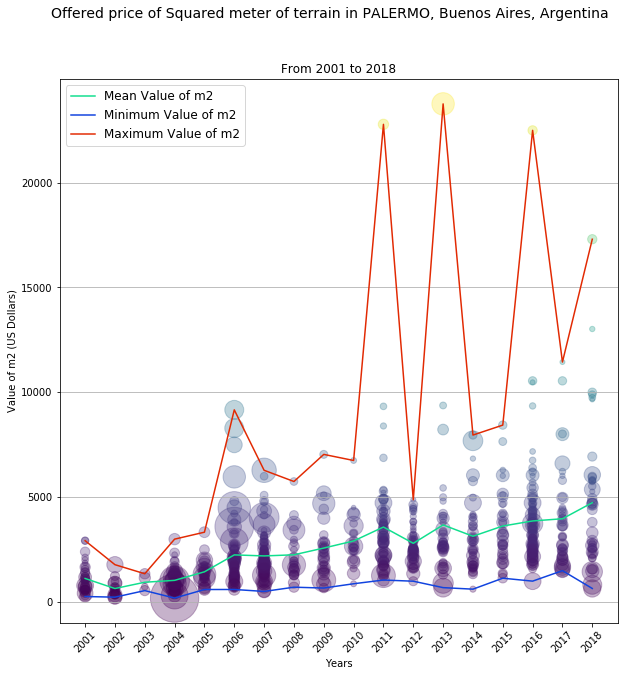

In [25]:
create_scatter_plot(palermo, 'PALERMO')

<p>After creating the first visualization for Palermo, we can see that the yearly mean value of the squared meter has increased through time.</p>

<IPython.core.display.Javascript object>


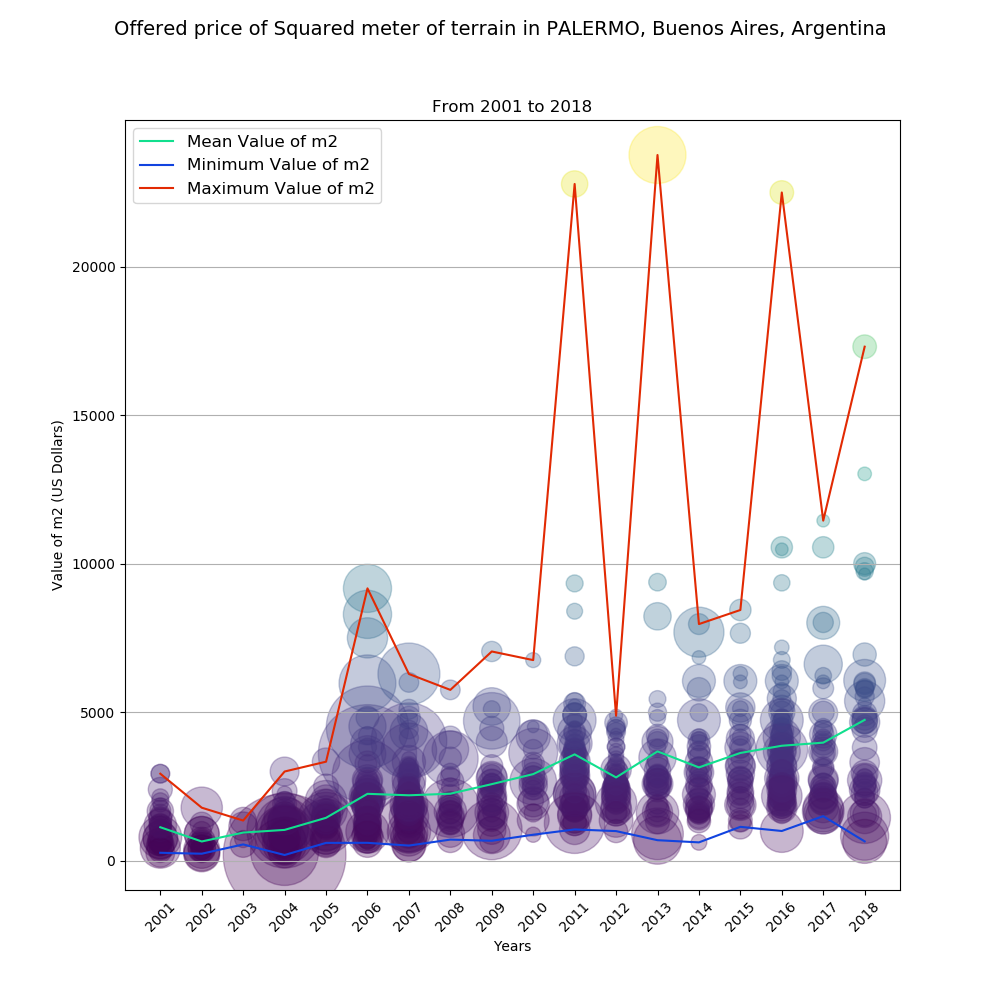

<IPython.core.display.Javascript object>


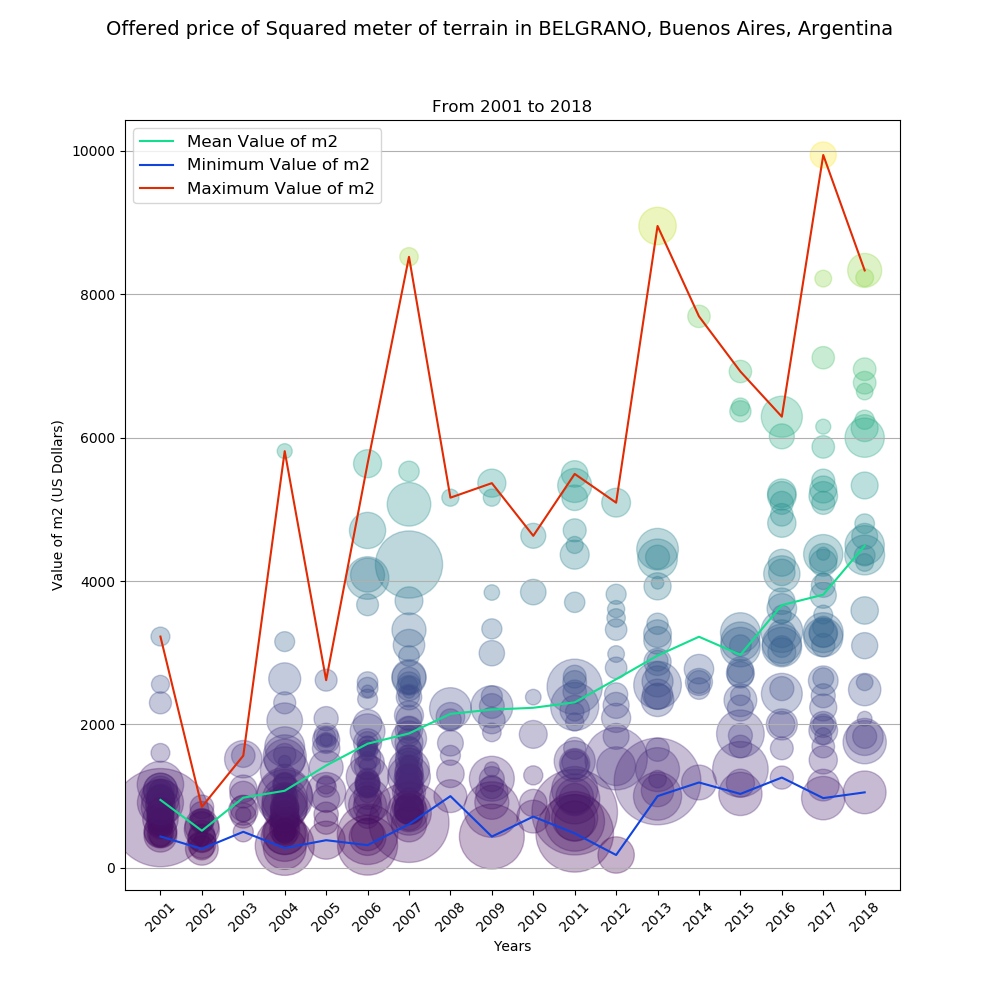

<IPython.core.display.Javascript object>


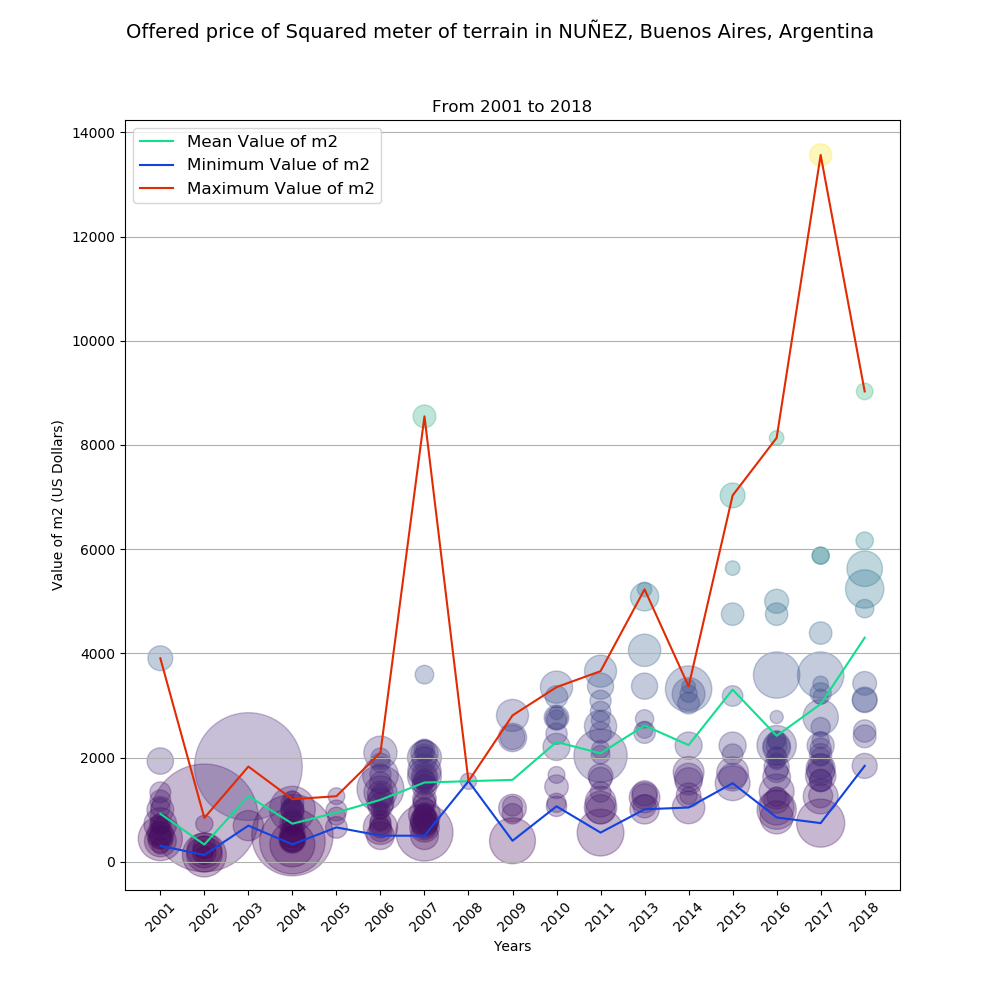

<IPython.core.display.Javascript object>


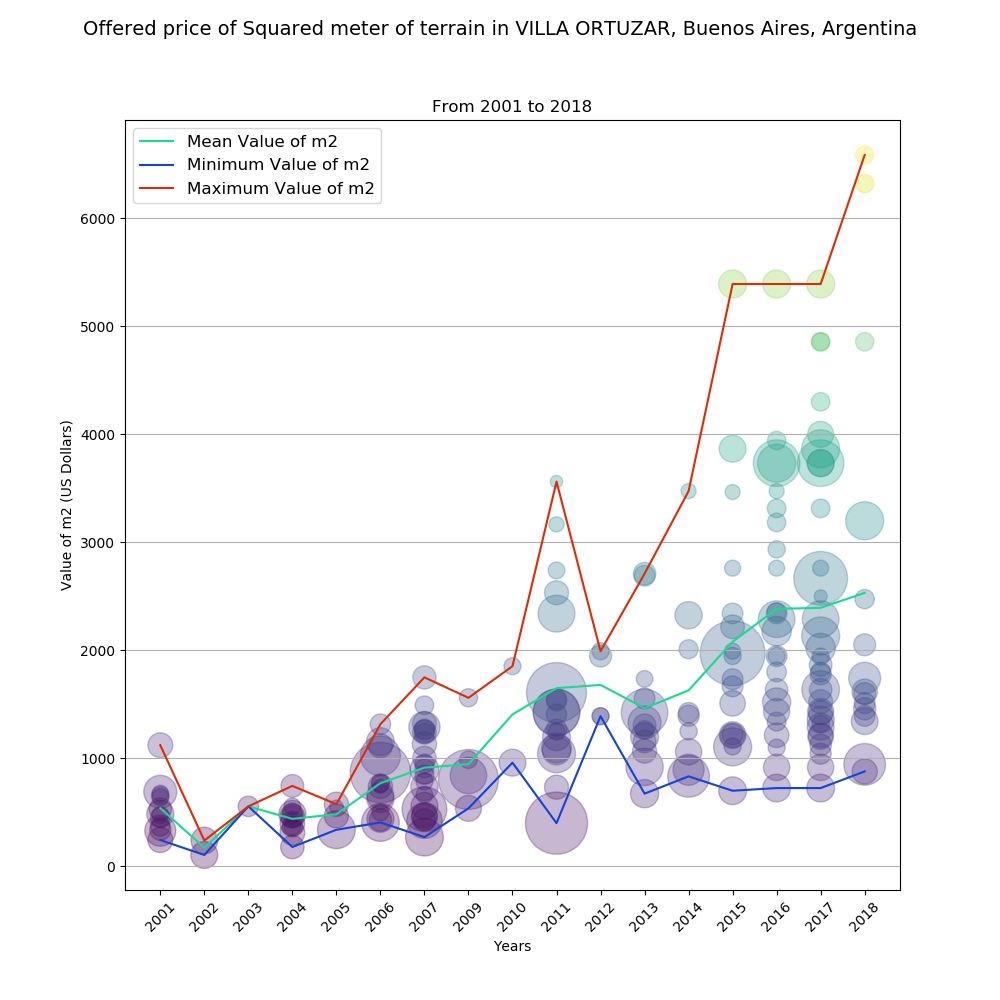

<IPython.core.display.Javascript object>


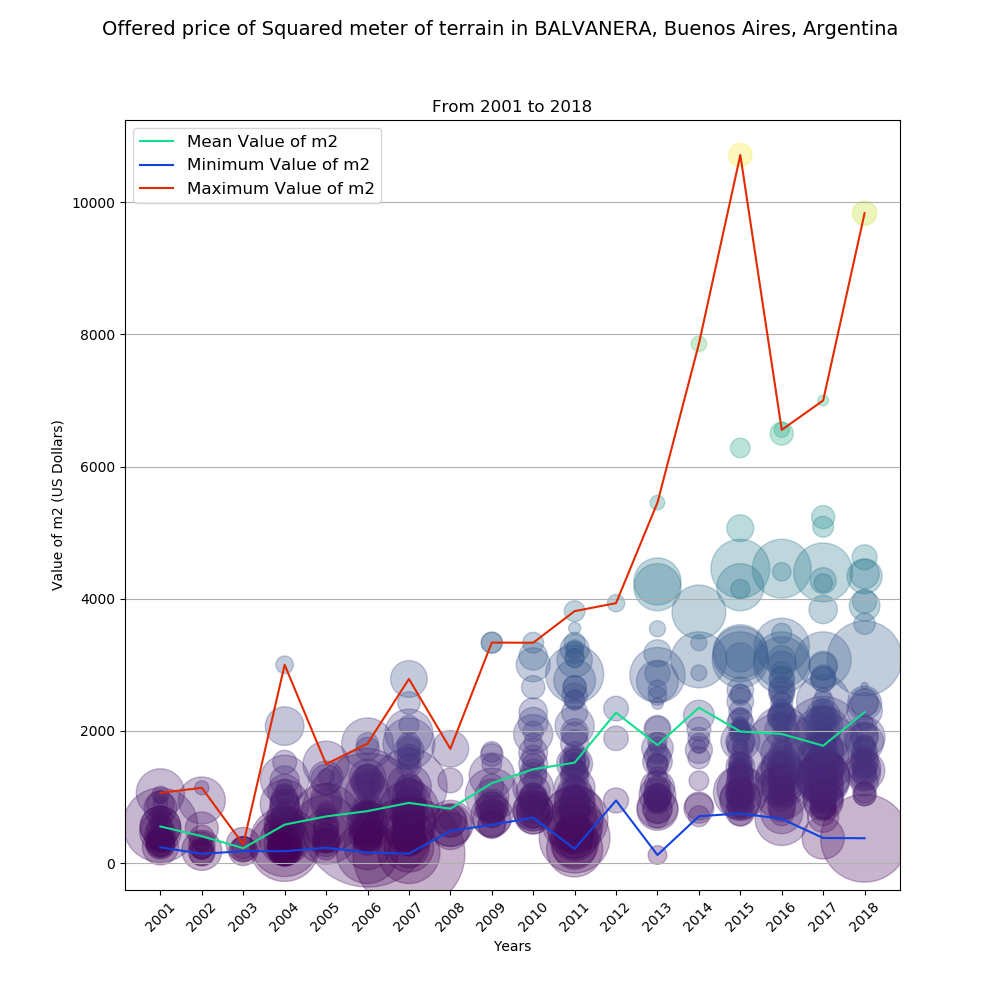

<IPython.core.display.Javascript object>


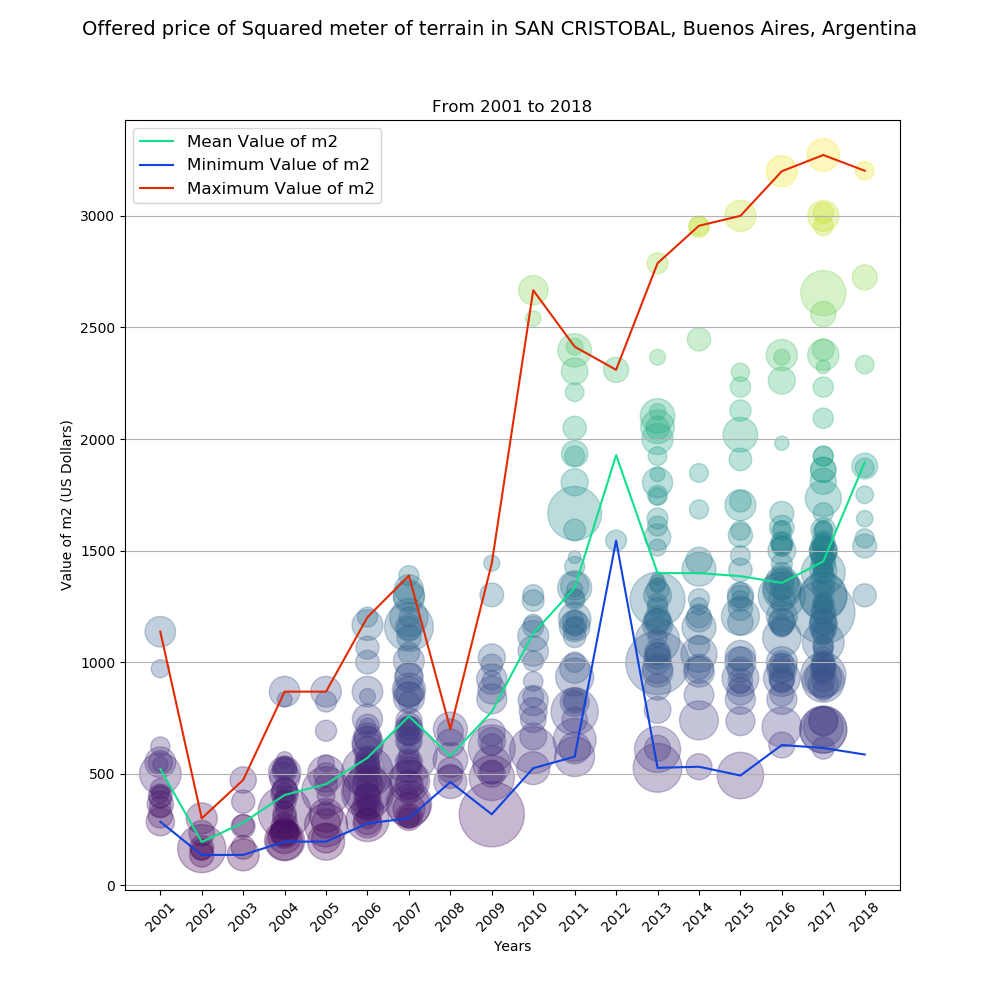

<IPython.core.display.Javascript object>


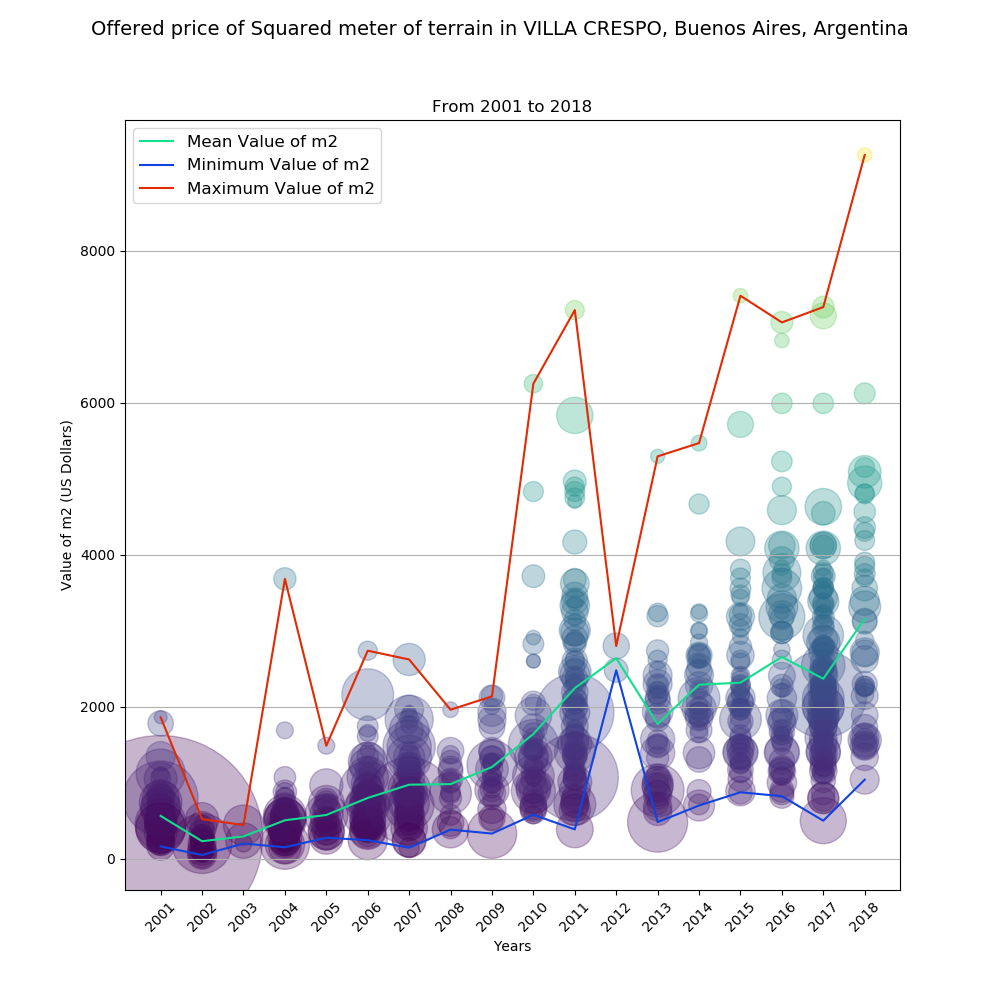

<IPython.core.display.Javascript object>


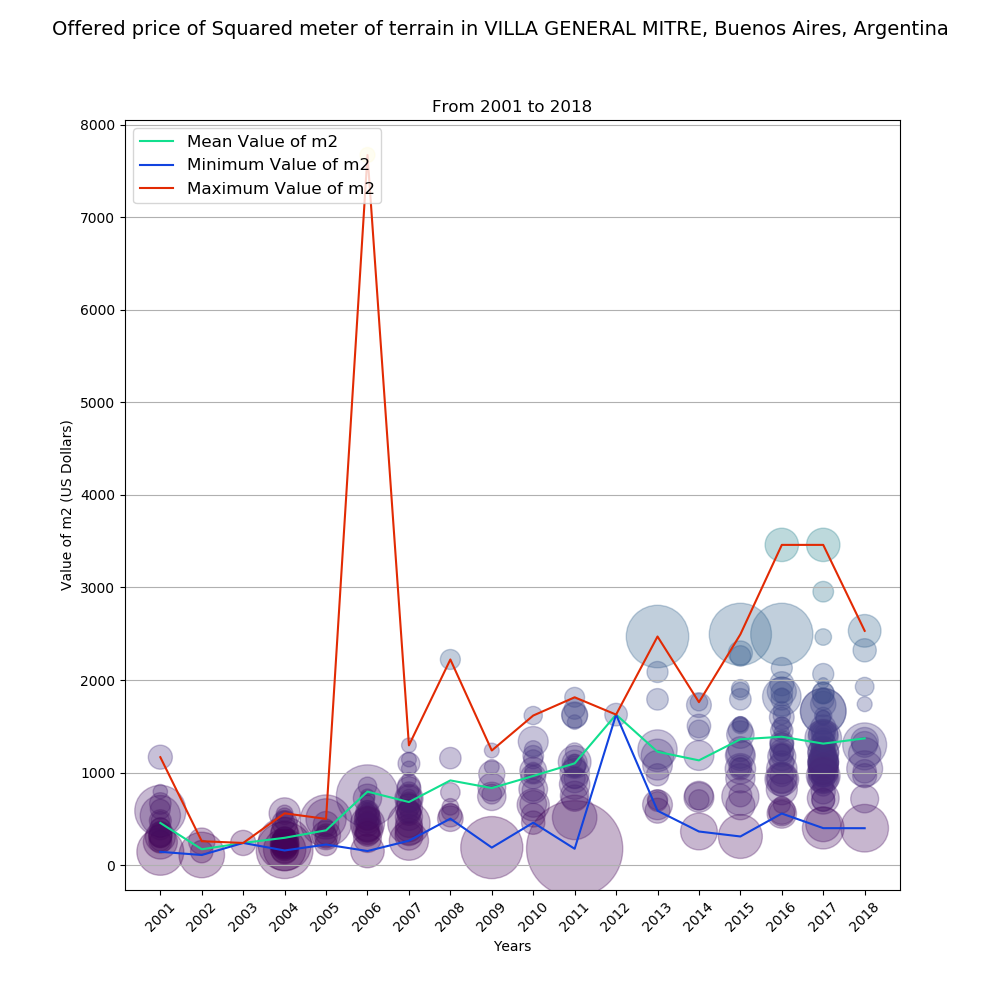

<IPython.core.display.Javascript object>


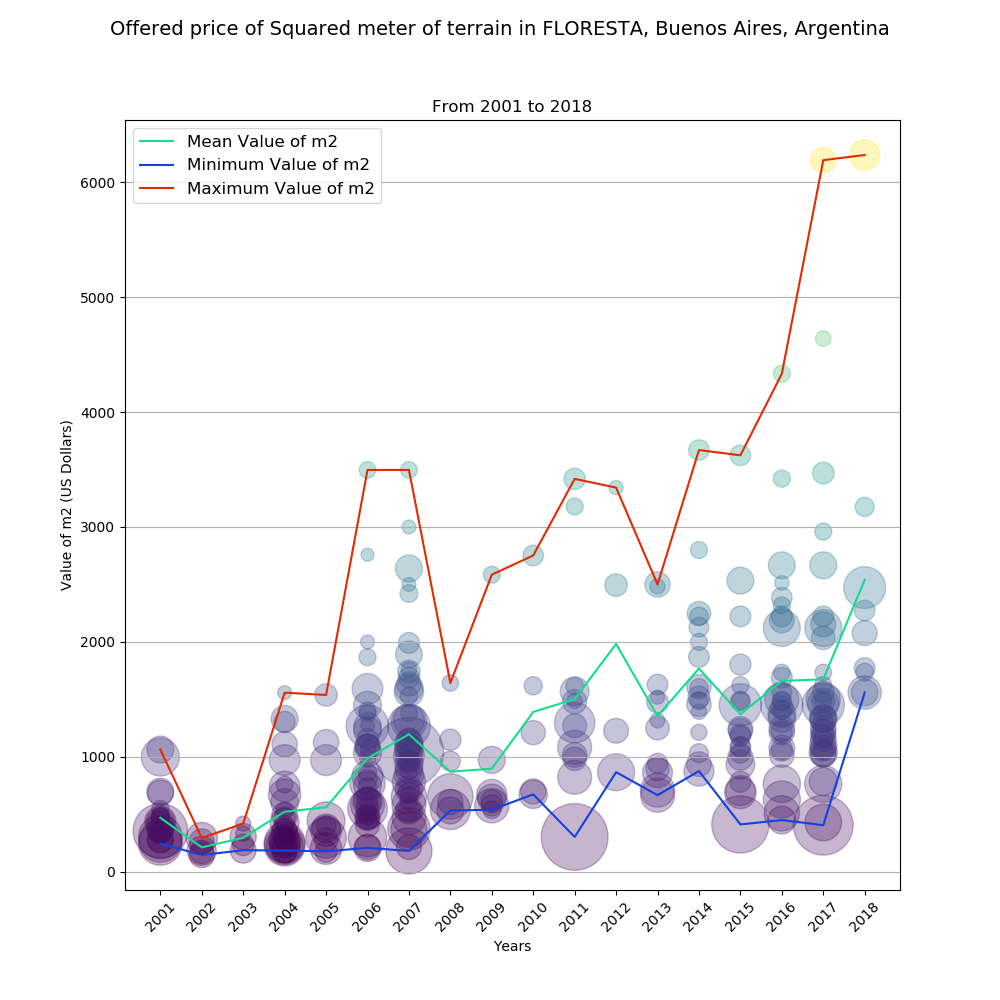

<IPython.core.display.Javascript object>


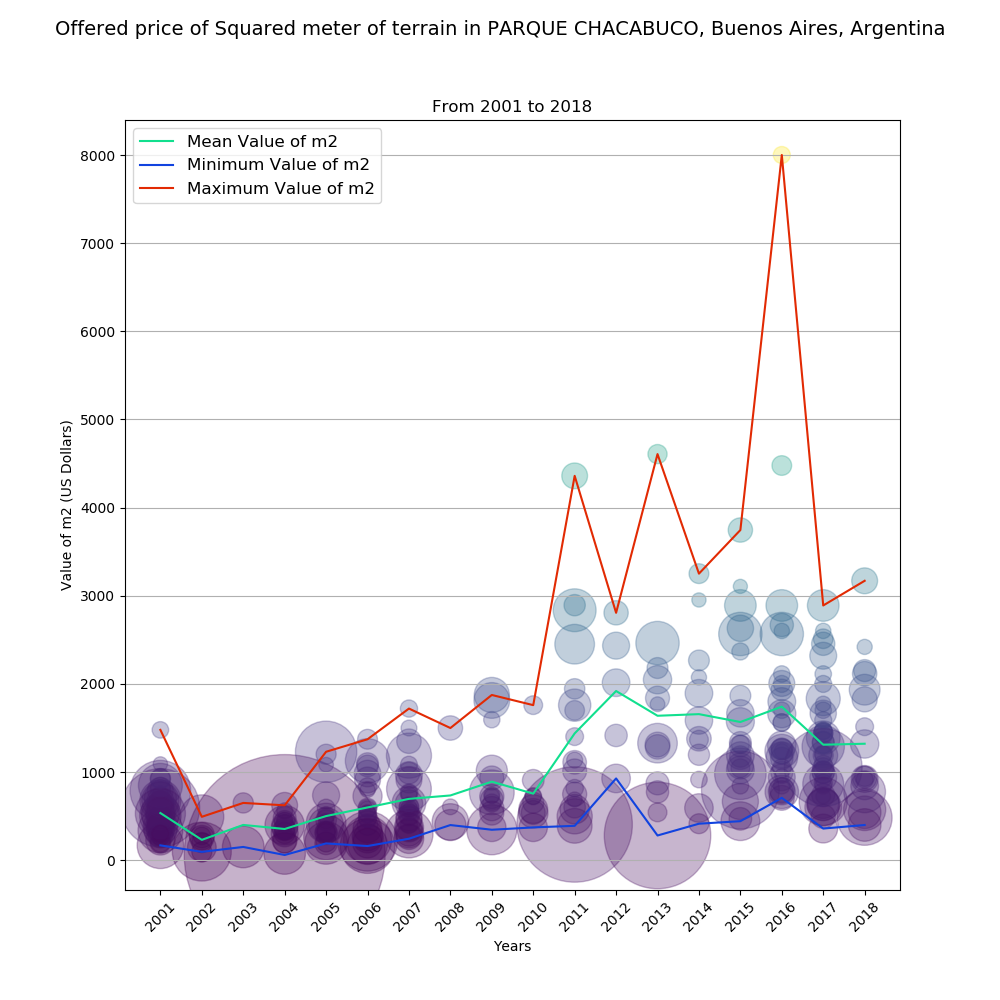

<IPython.core.display.Javascript object>


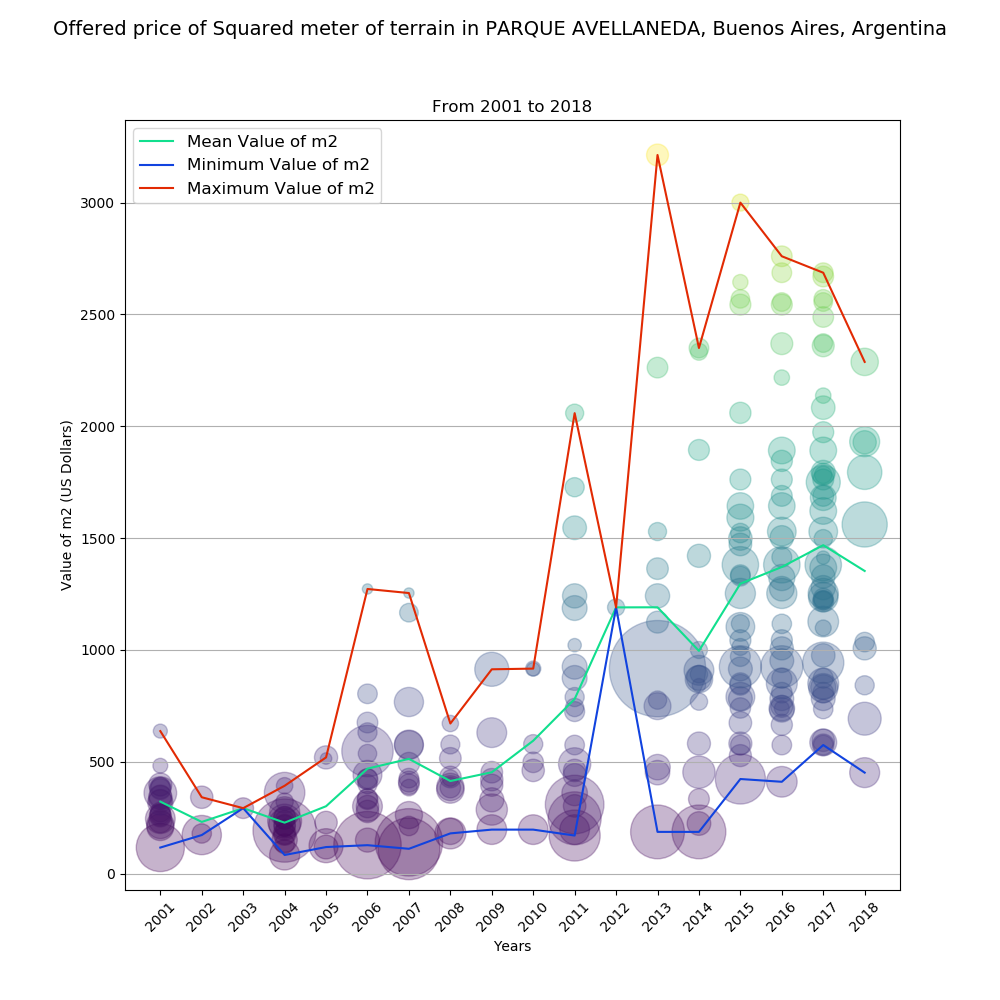

<IPython.core.display.Javascript object>


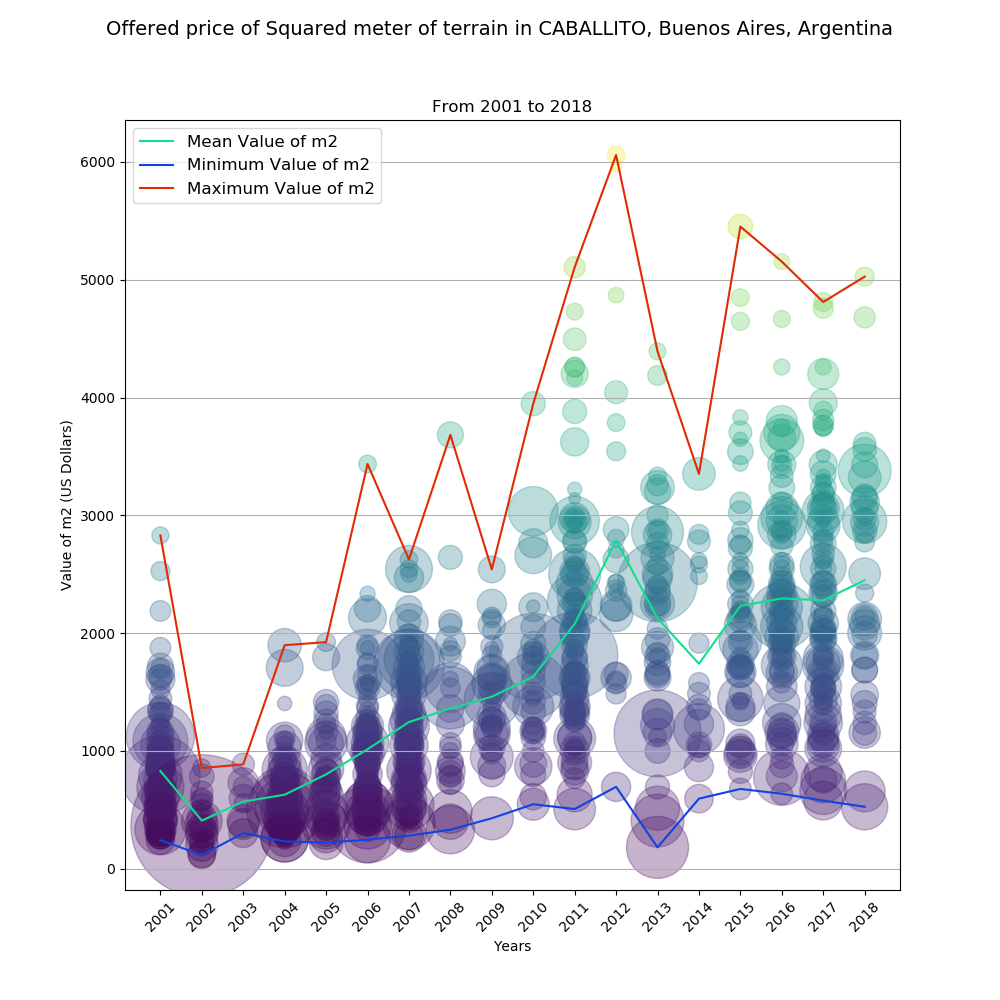

<IPython.core.display.Javascript object>


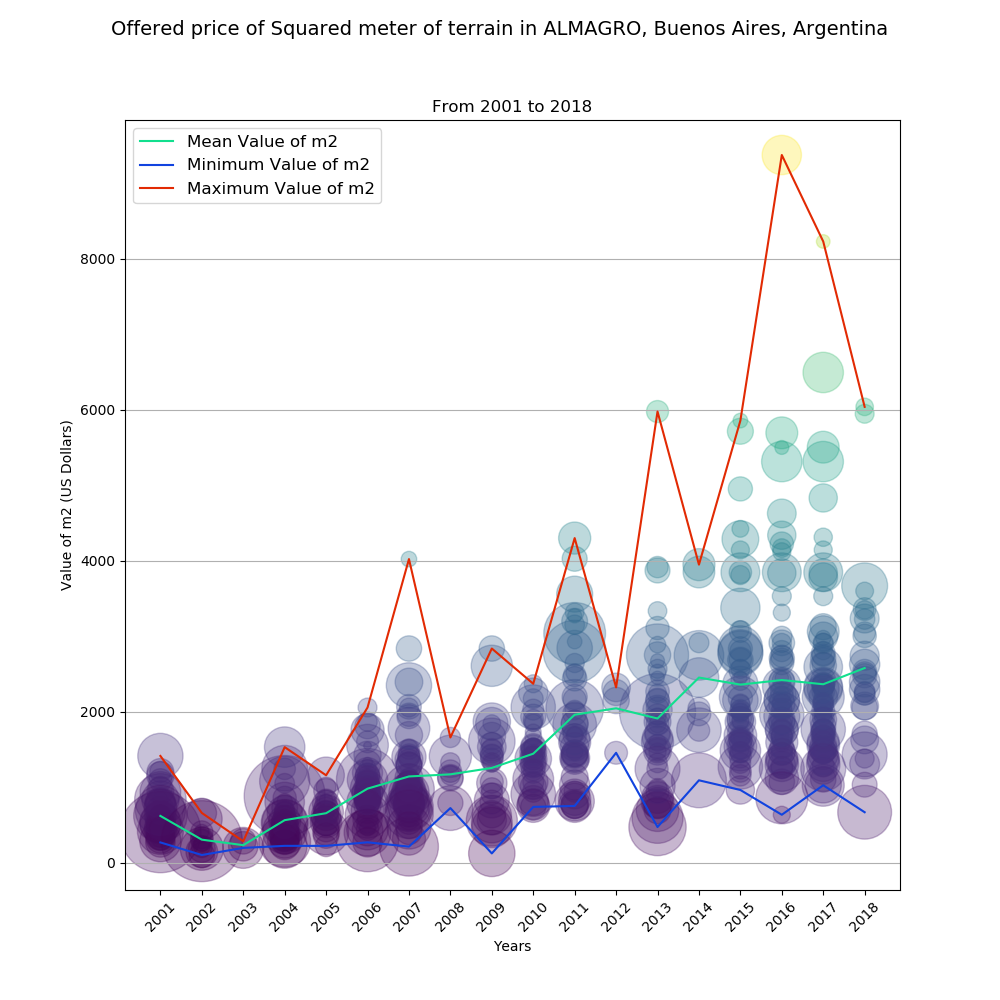

<IPython.core.display.Javascript object>


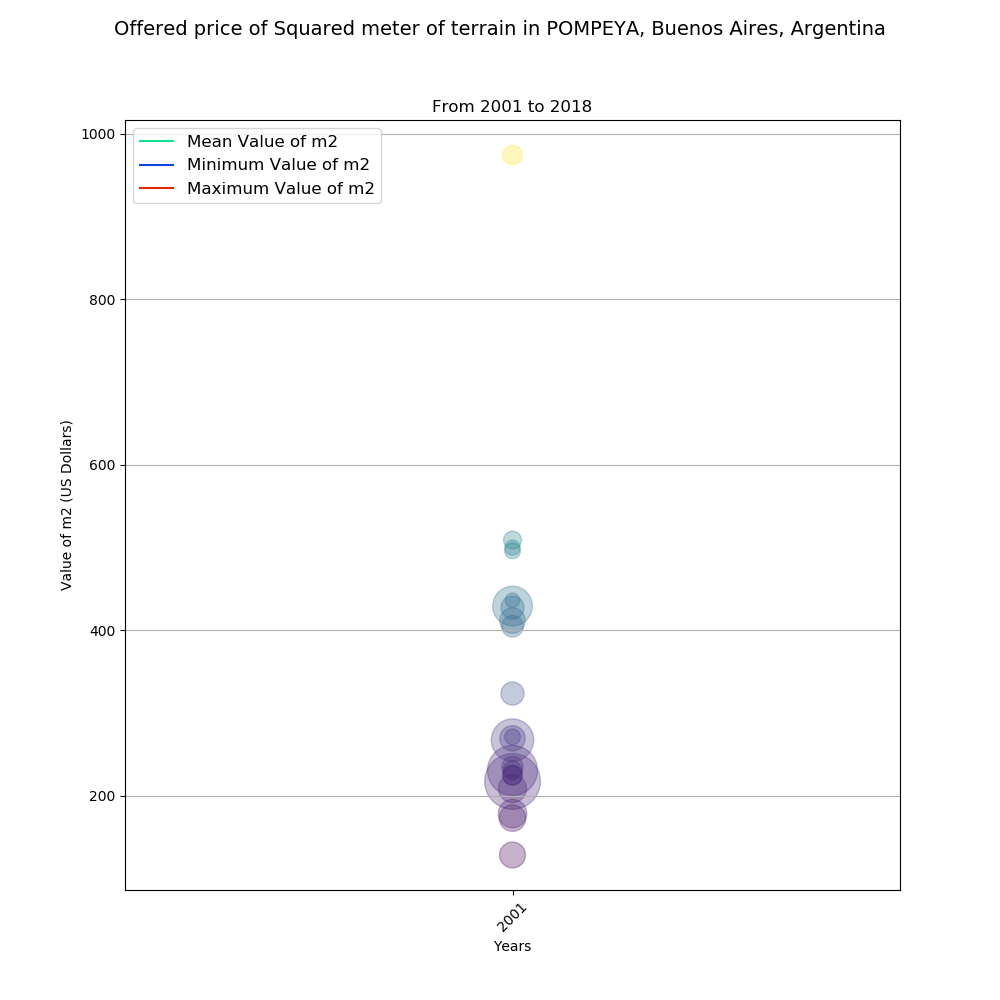

<IPython.core.display.Javascript object>


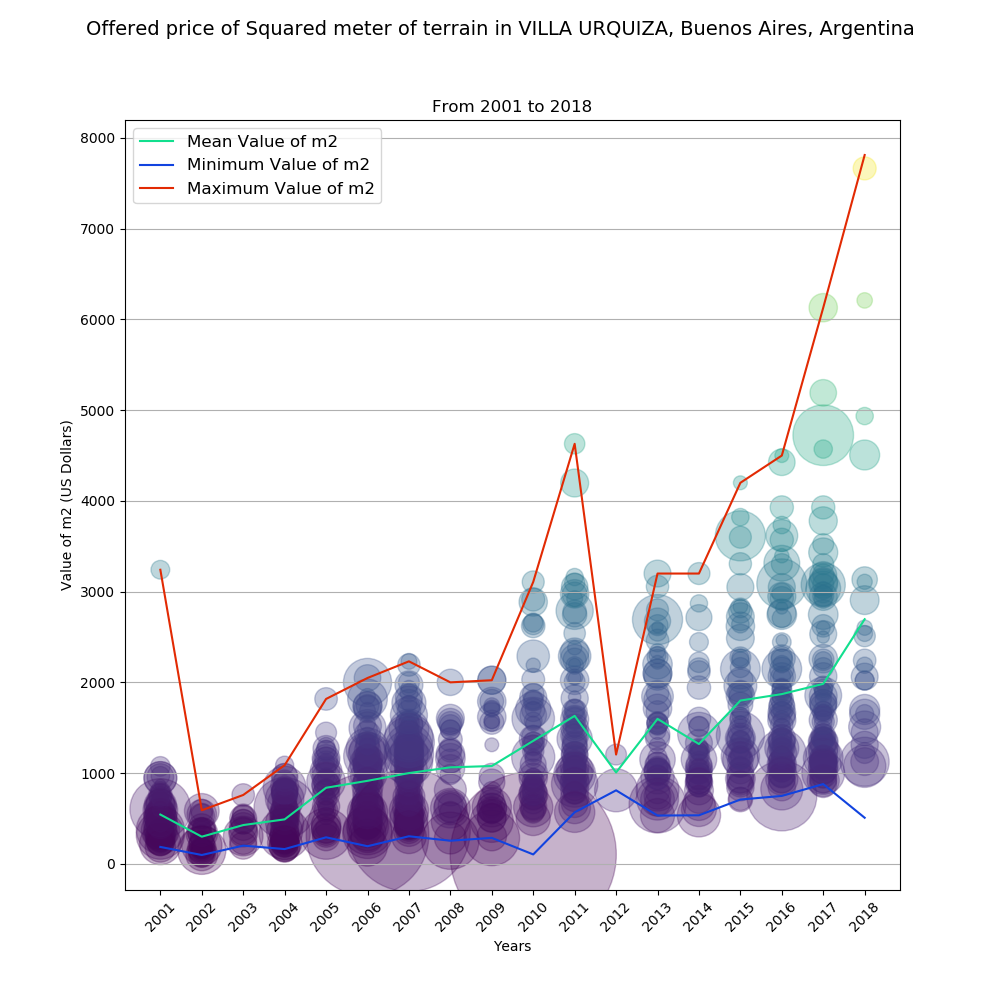

<IPython.core.display.Javascript object>


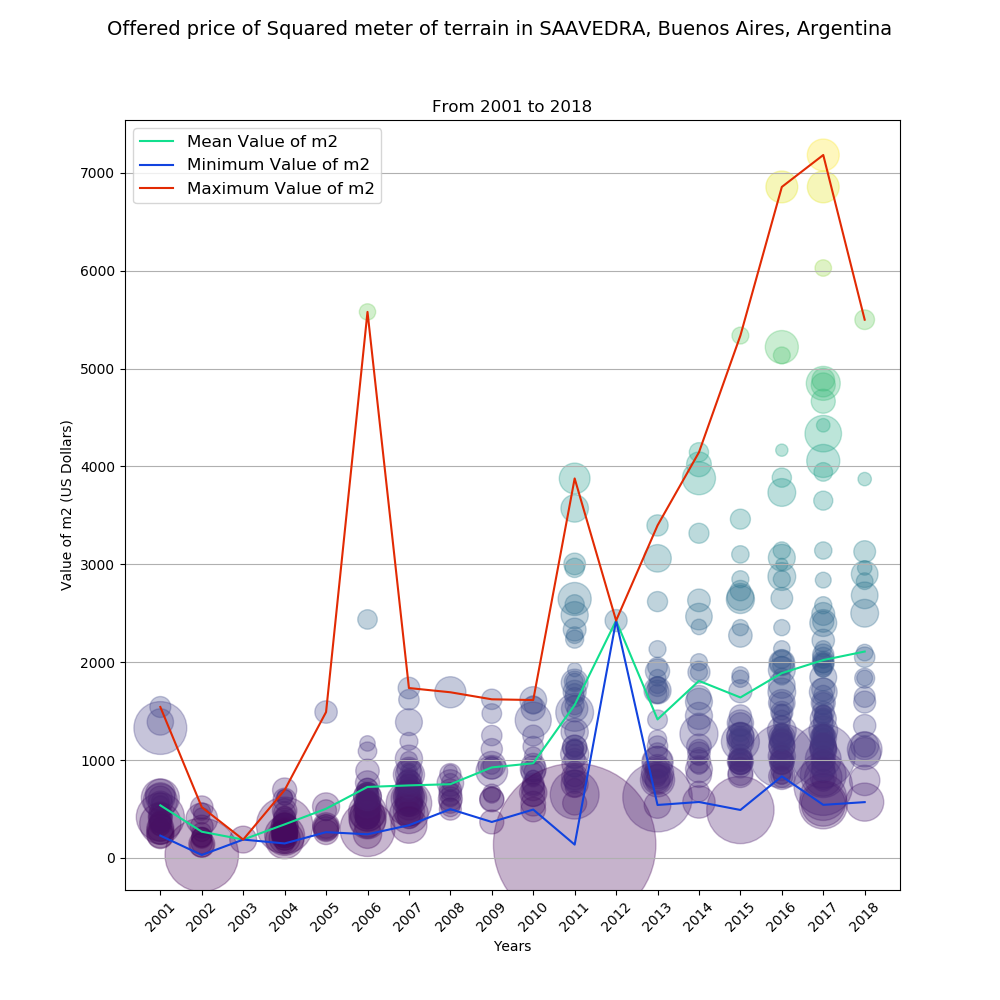

<IPython.core.display.Javascript object>


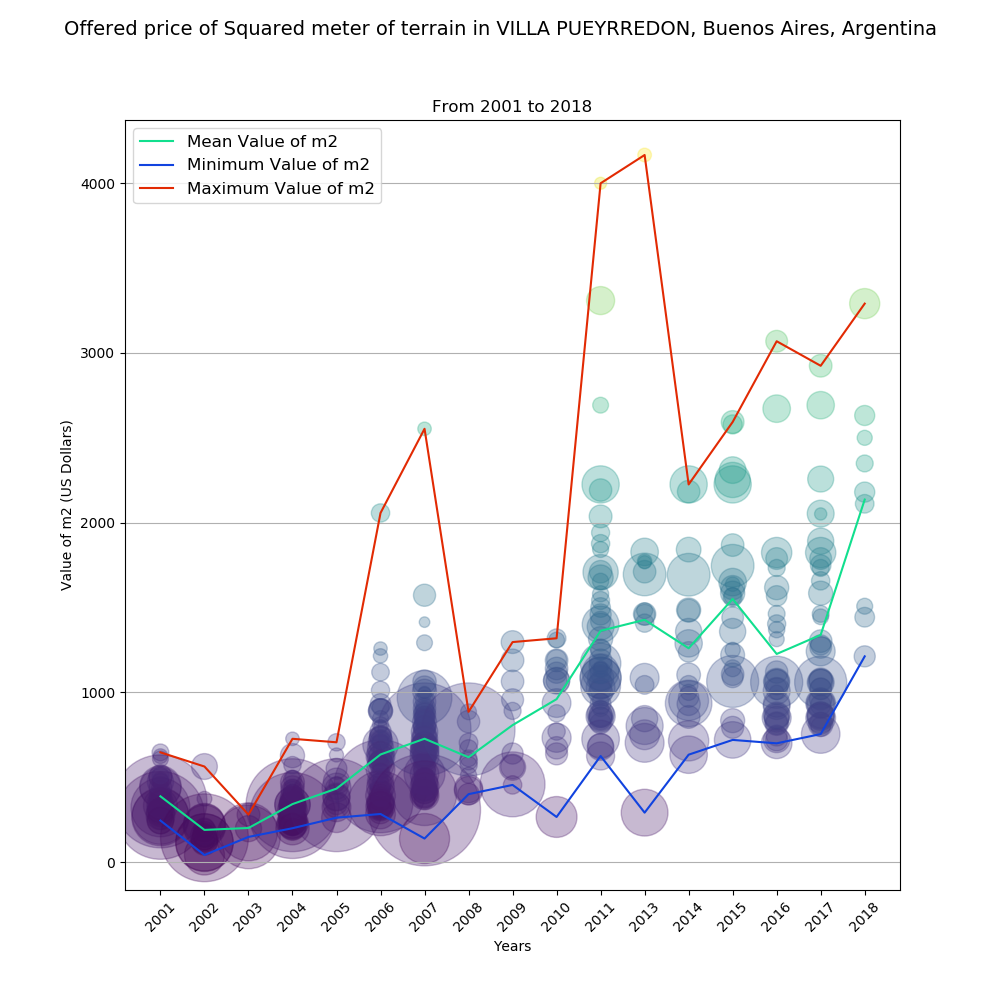

<IPython.core.display.Javascript object>


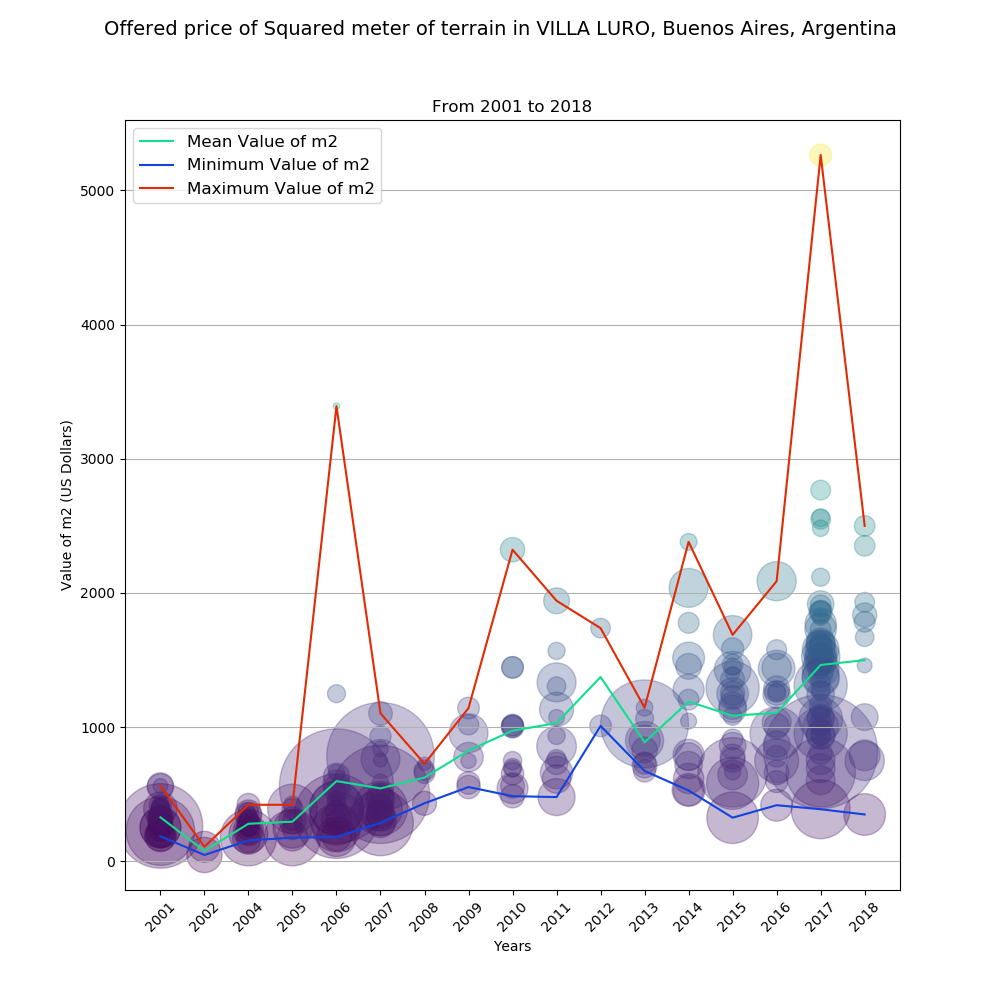

<IPython.core.display.Javascript object>


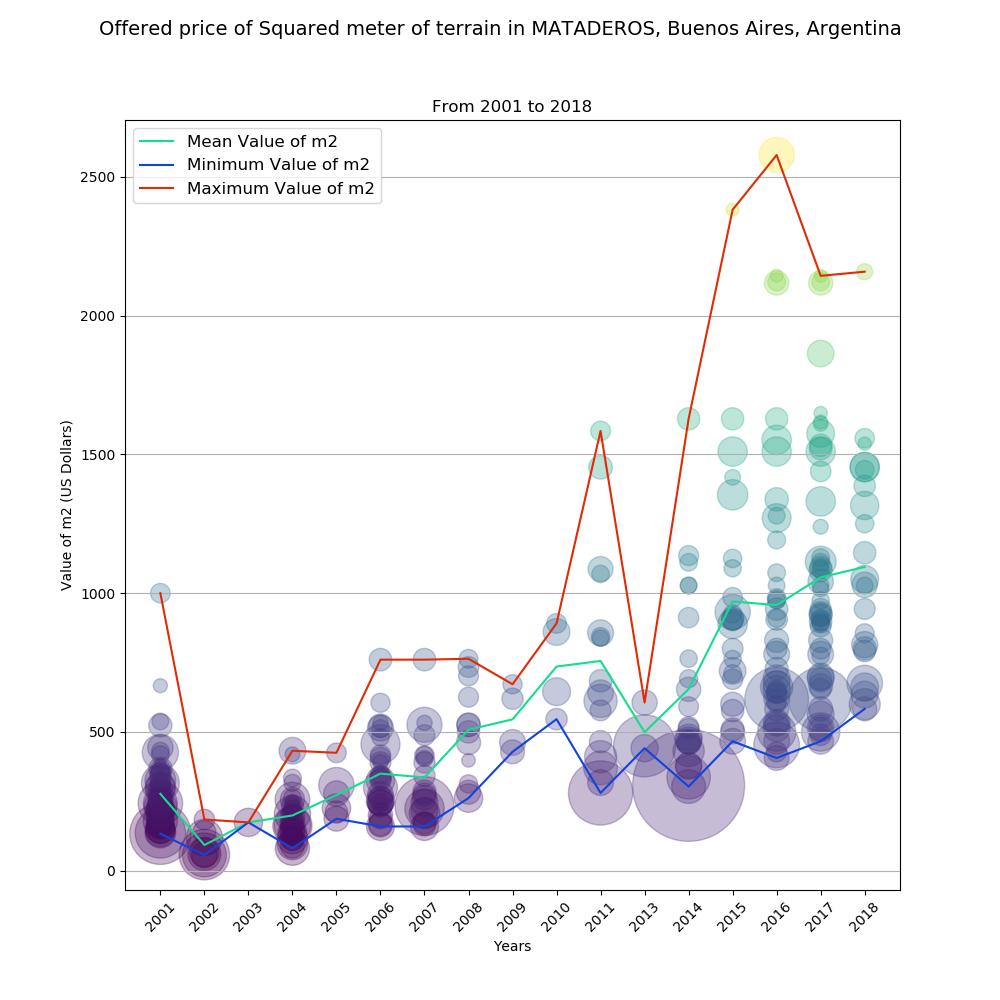

c:\users\jason\appdata\local\programs\python\python36\lib\site-packages\matplotlib\pyplot.py:537: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).
  max_open_warning, RuntimeWarning)


<IPython.core.display.Javascript object>


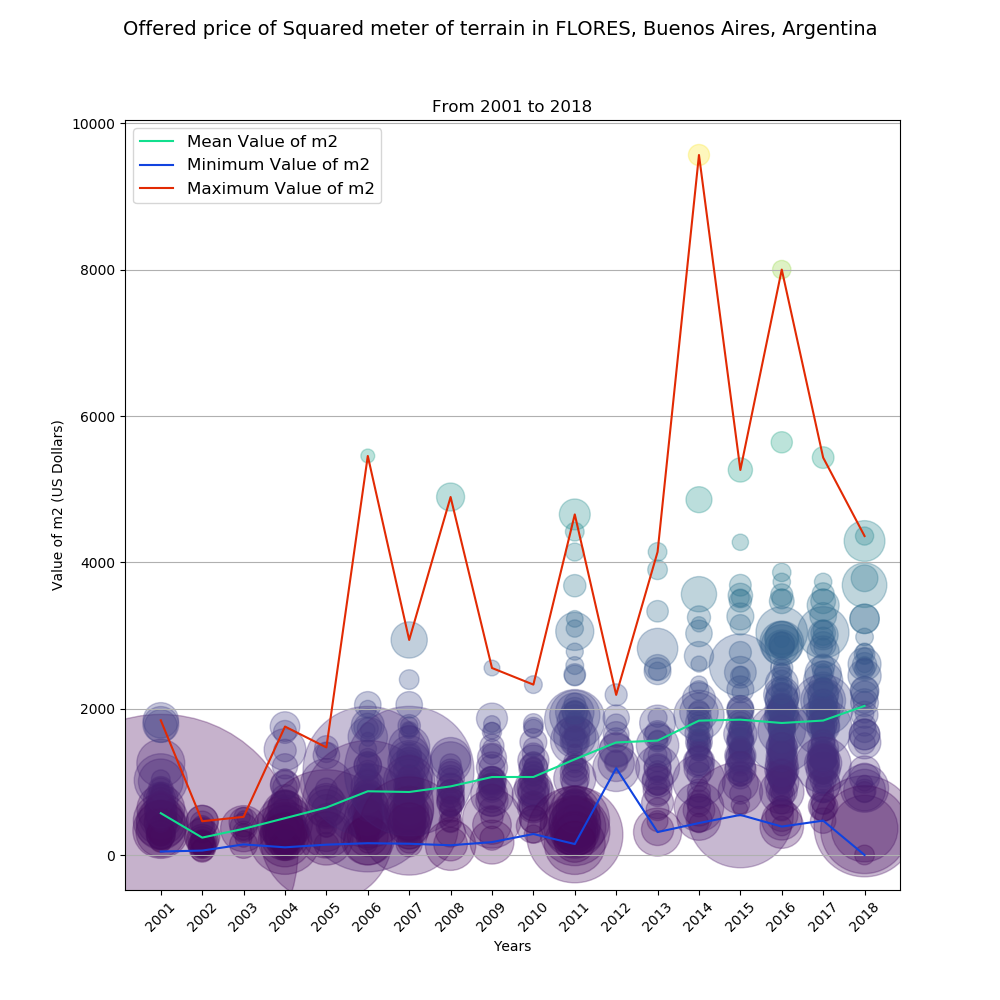

<IPython.core.display.Javascript object>


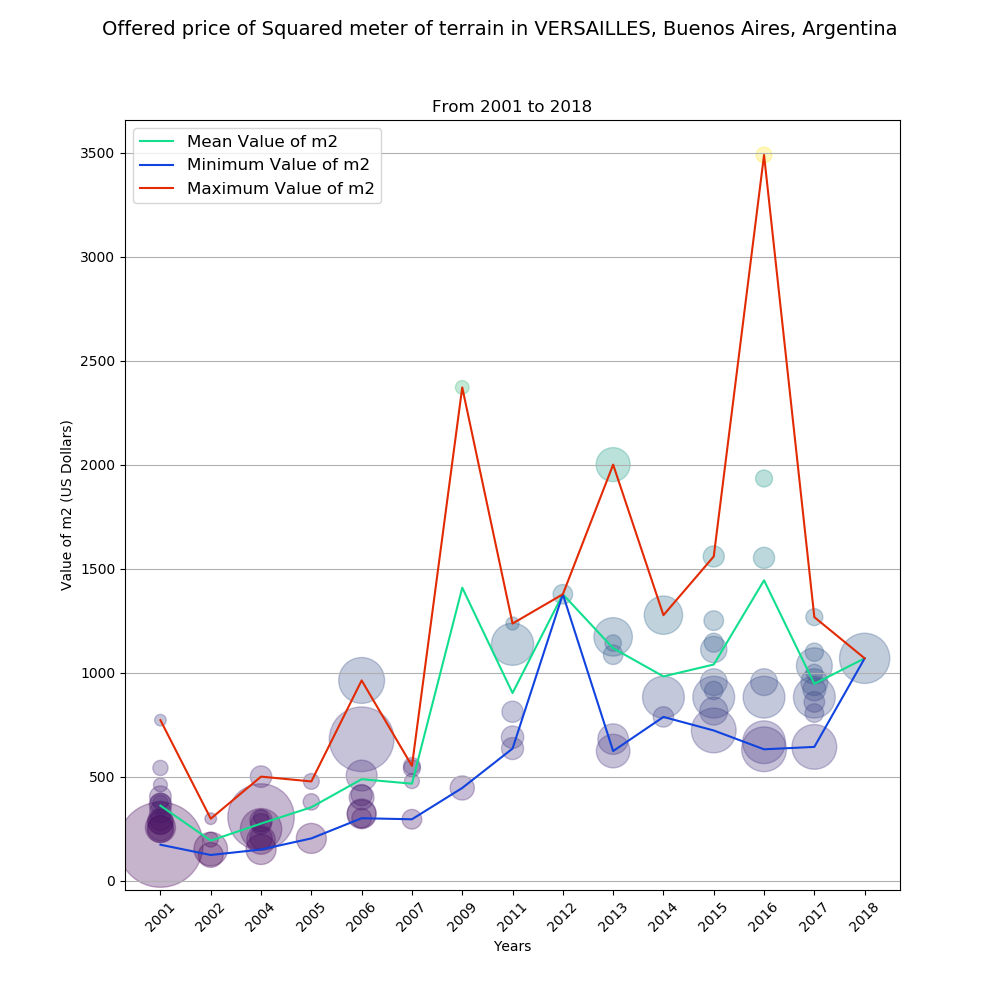

<IPython.core.display.Javascript object>


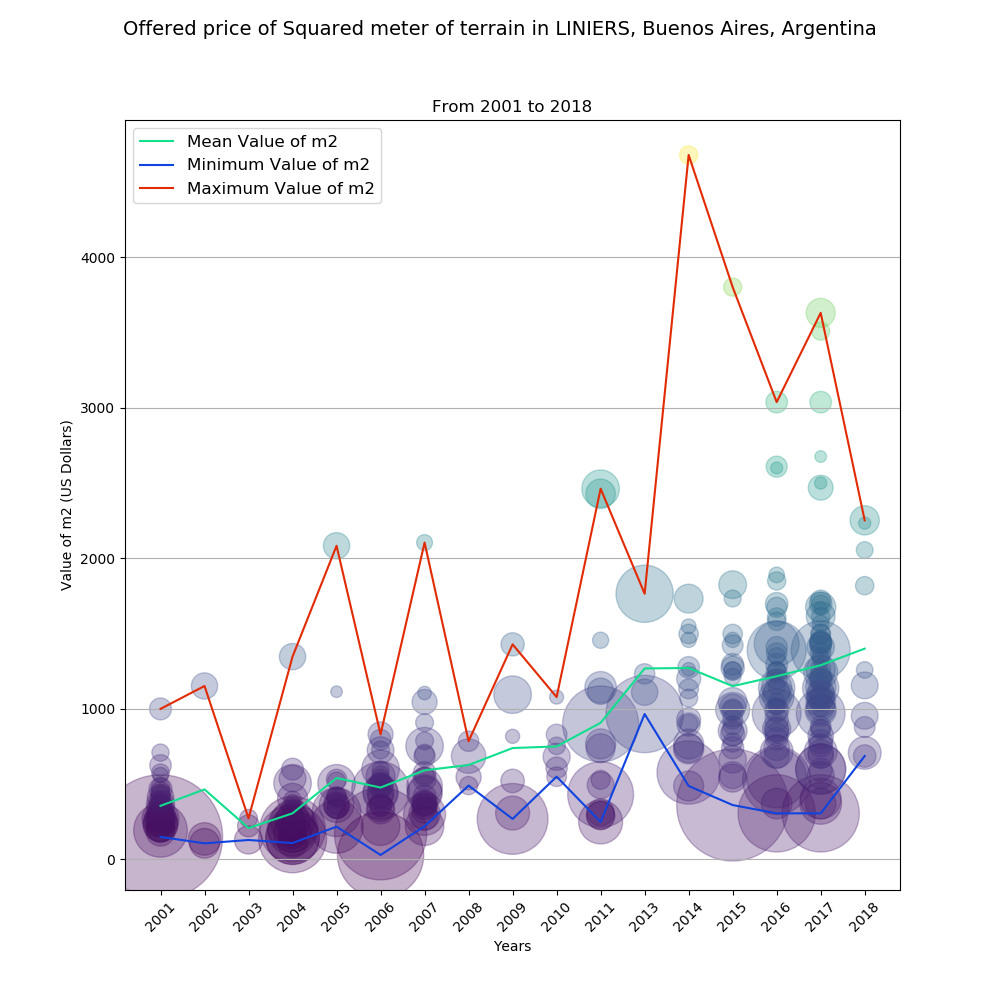

<IPython.core.display.Javascript object>


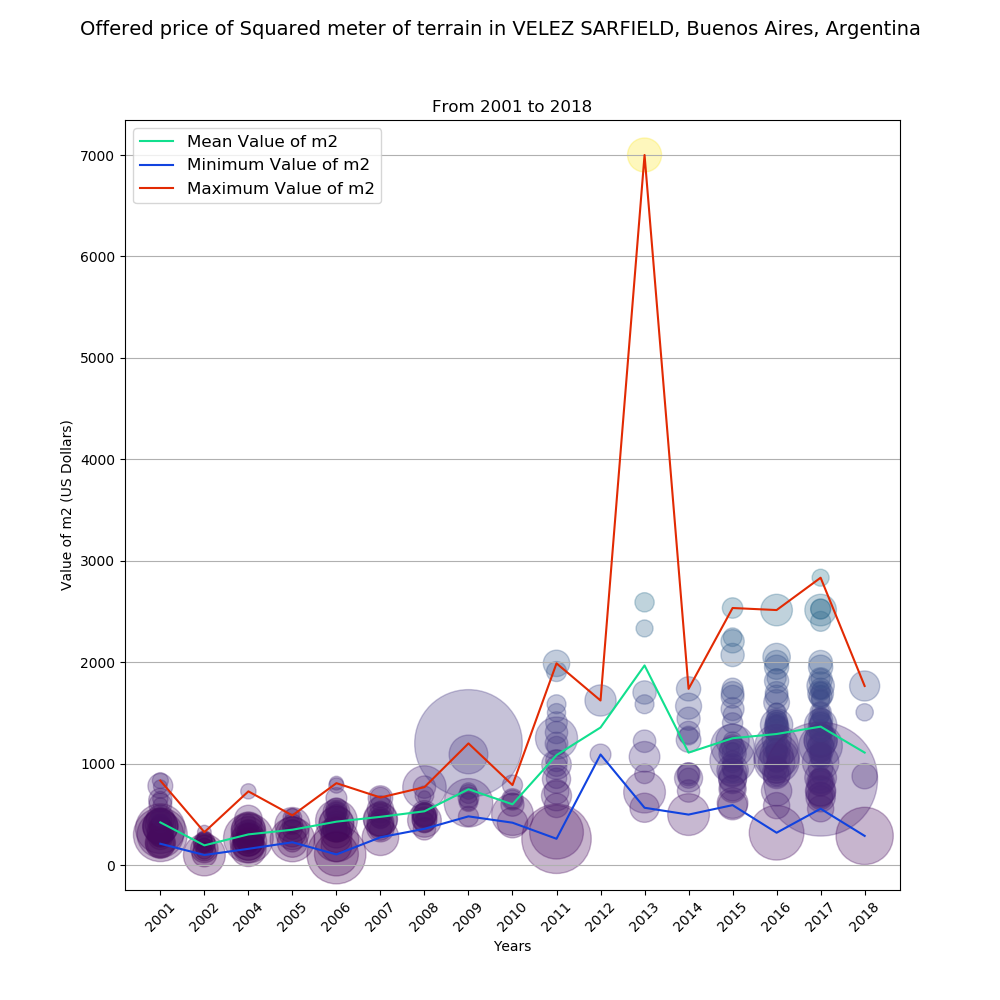

<IPython.core.display.Javascript object>


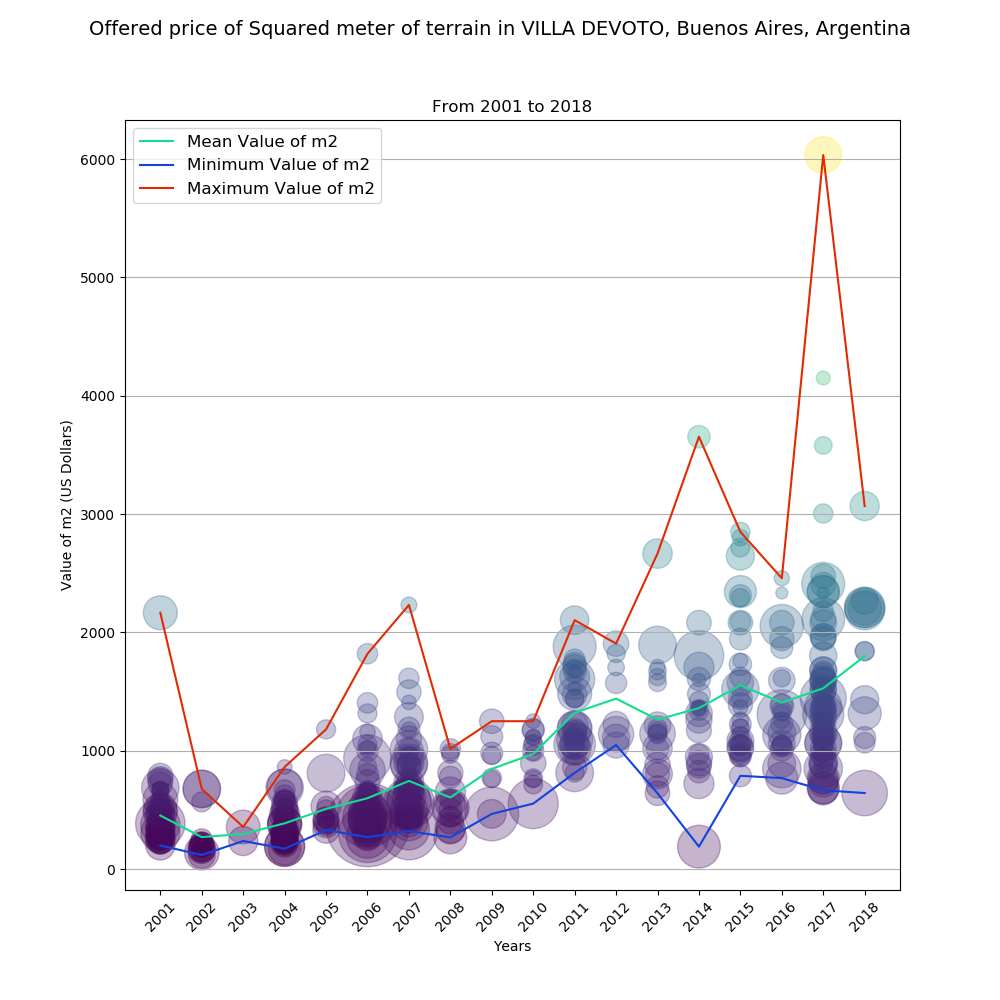

<IPython.core.display.Javascript object>


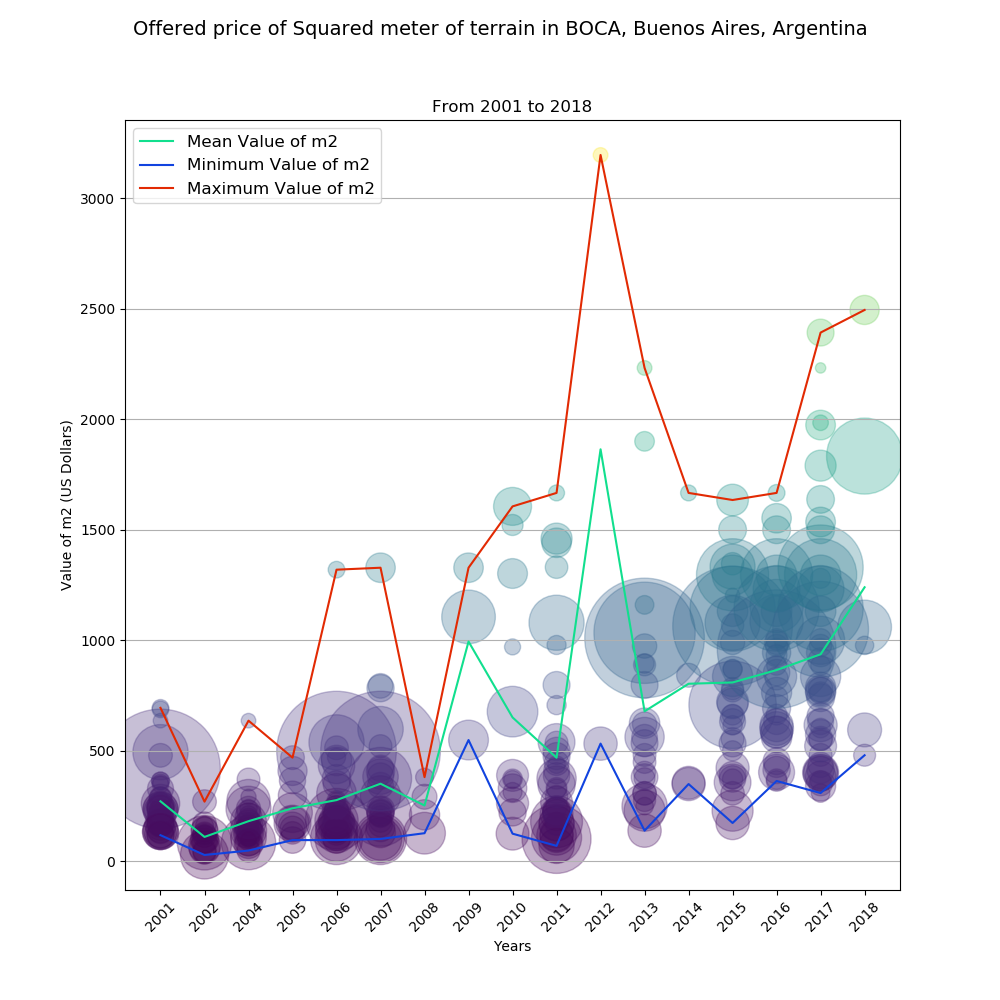

<IPython.core.display.Javascript object>


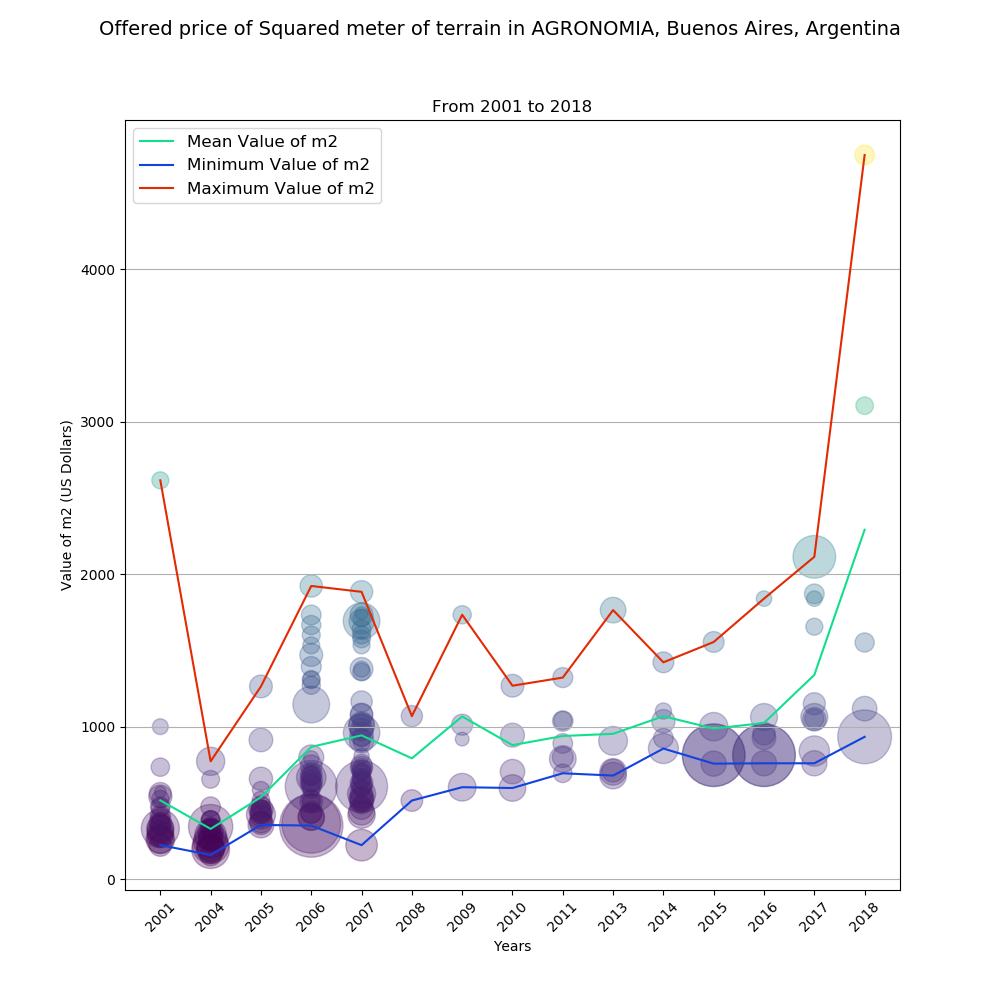

<IPython.core.display.Javascript object>


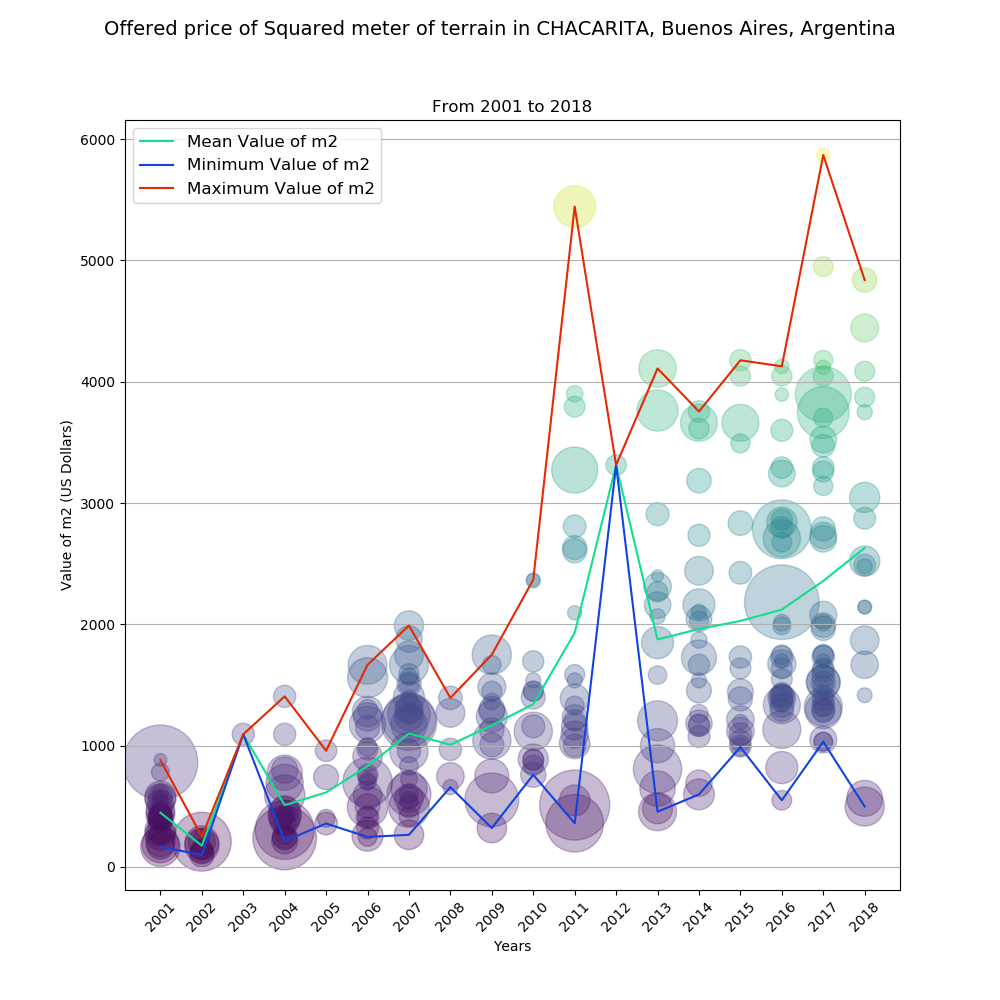

<IPython.core.display.Javascript object>


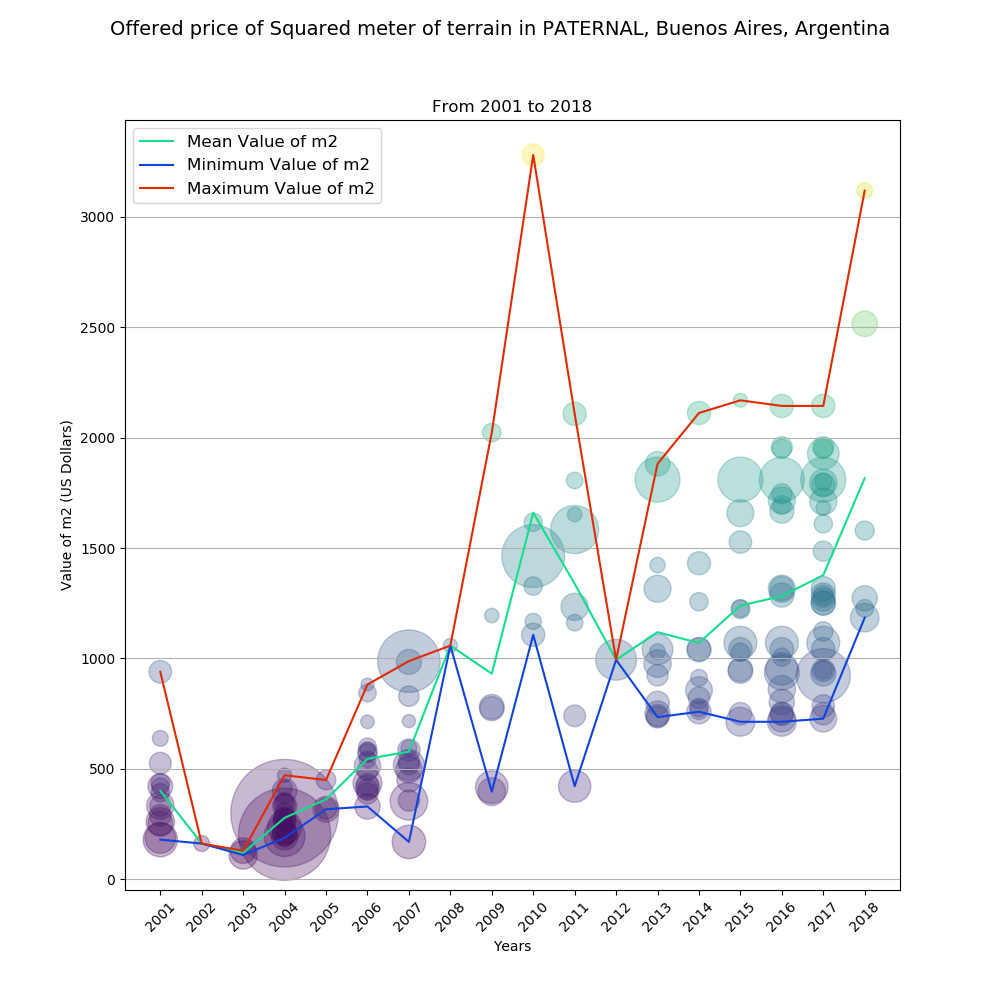

<IPython.core.display.Javascript object>


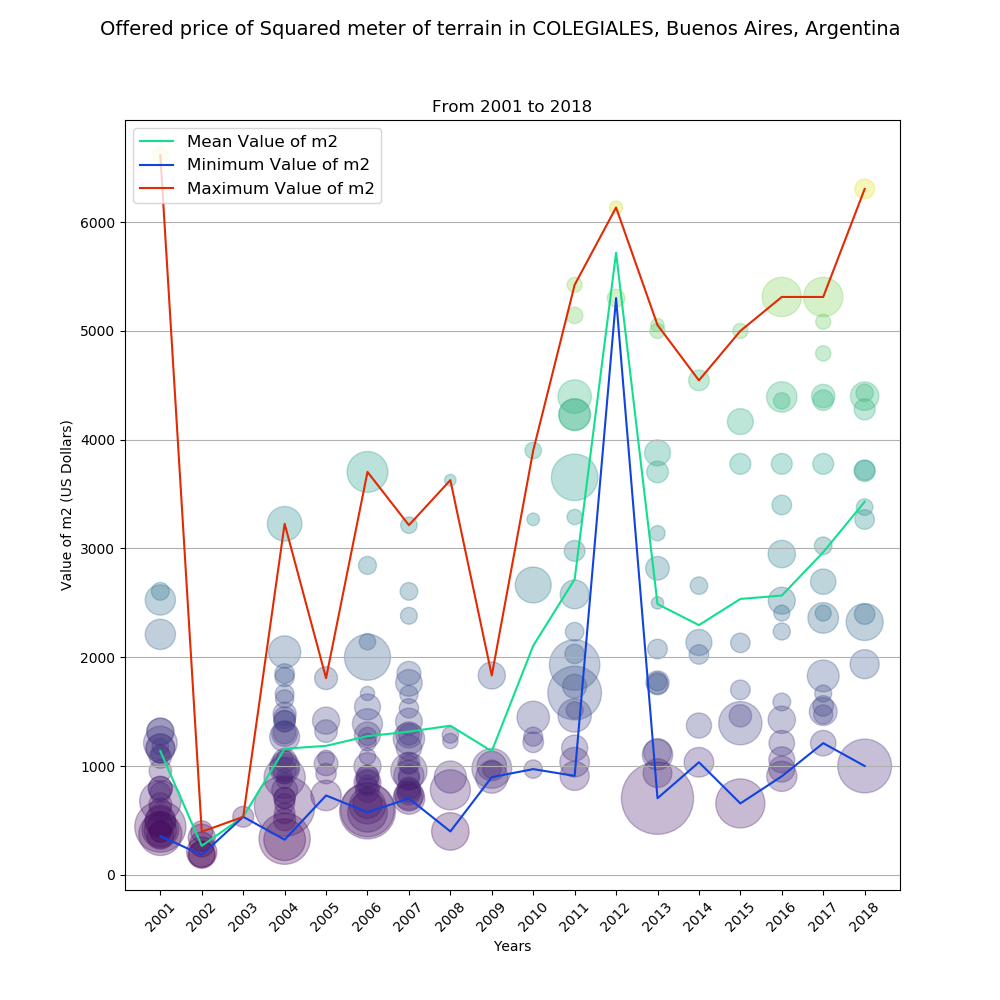

<IPython.core.display.Javascript object>


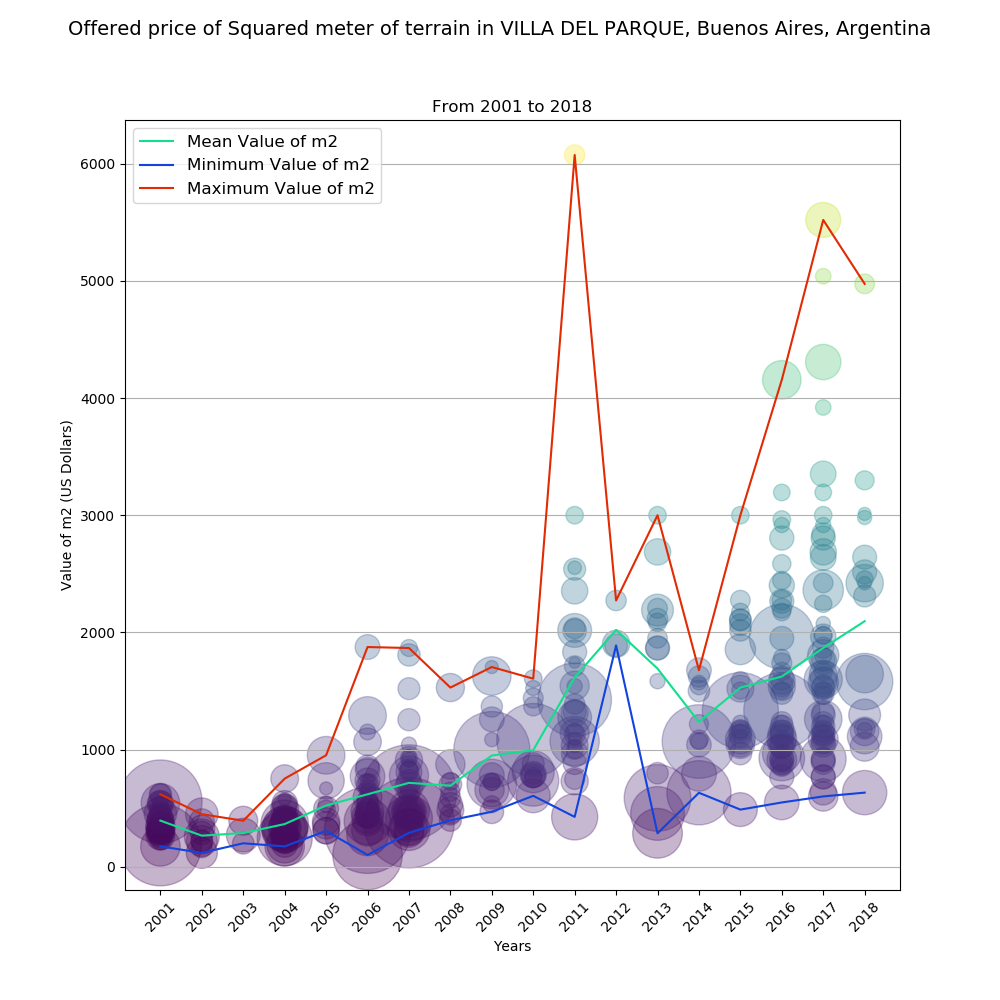

<IPython.core.display.Javascript object>


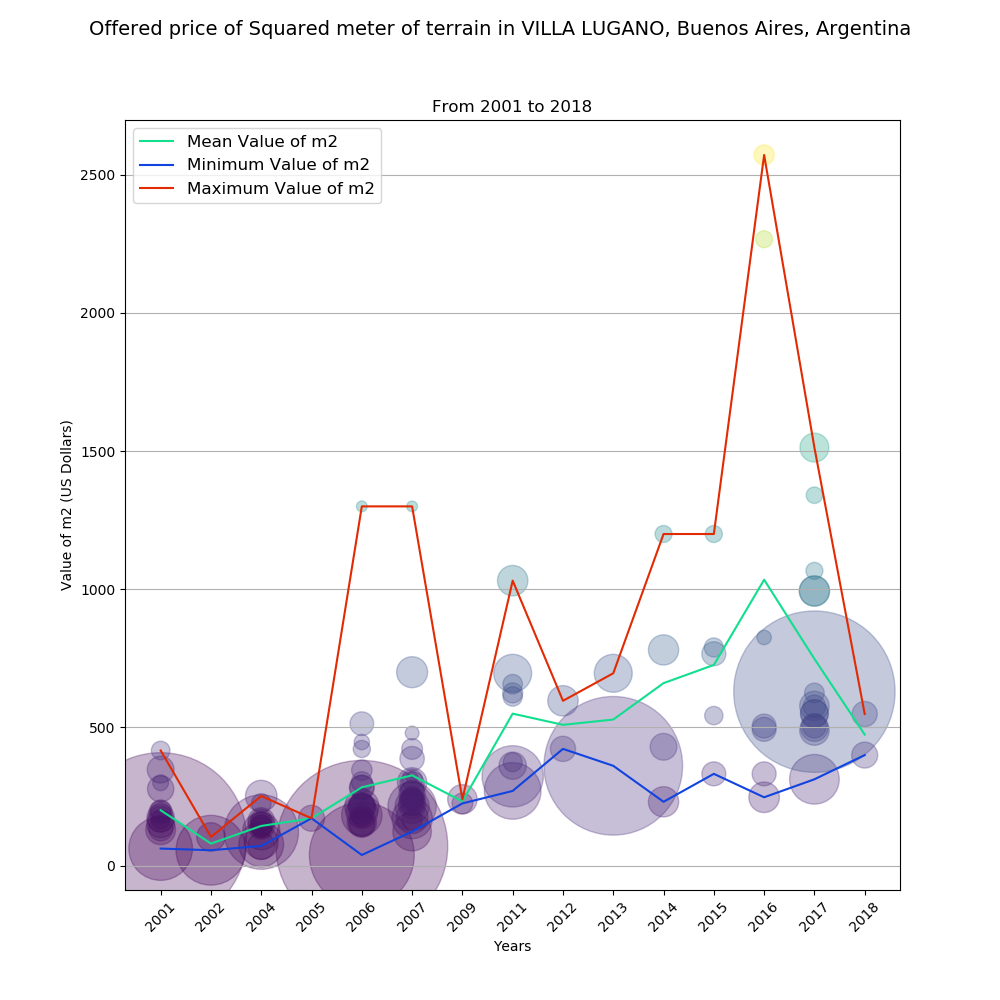

<IPython.core.display.Javascript object>


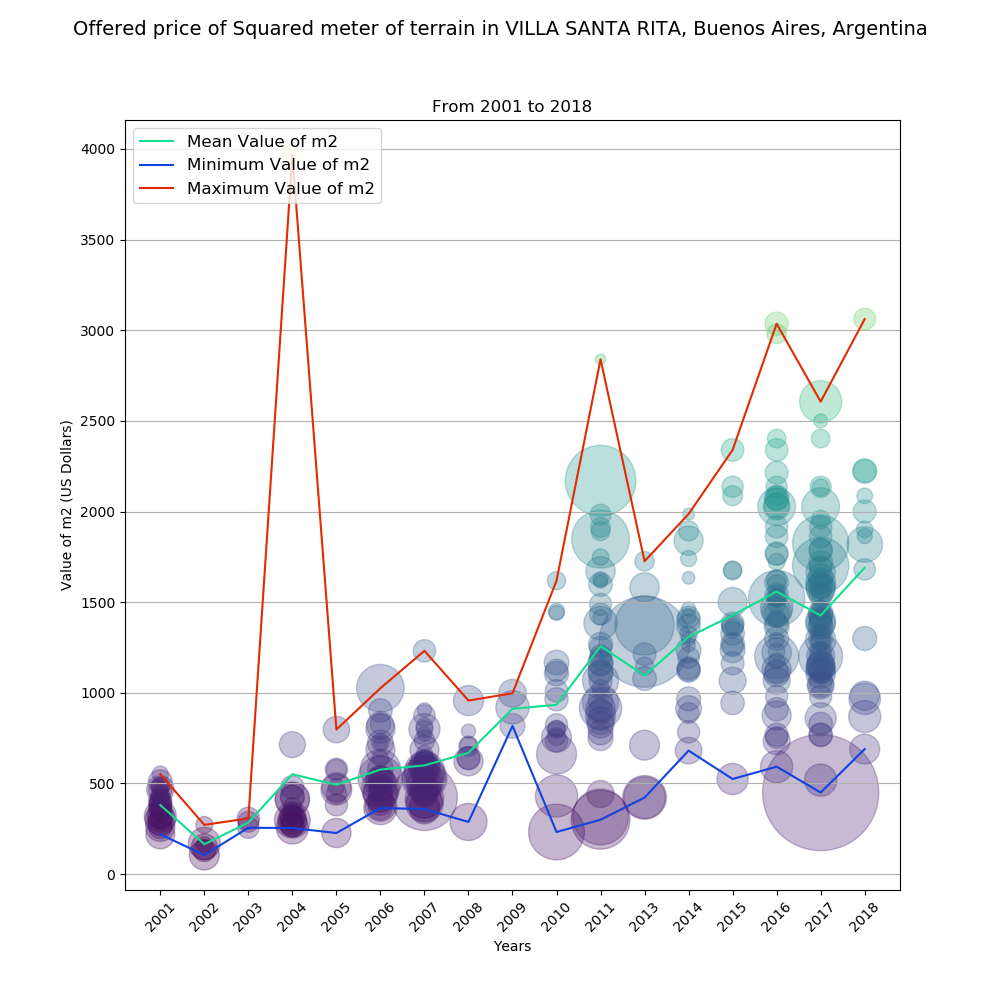

<IPython.core.display.Javascript object>


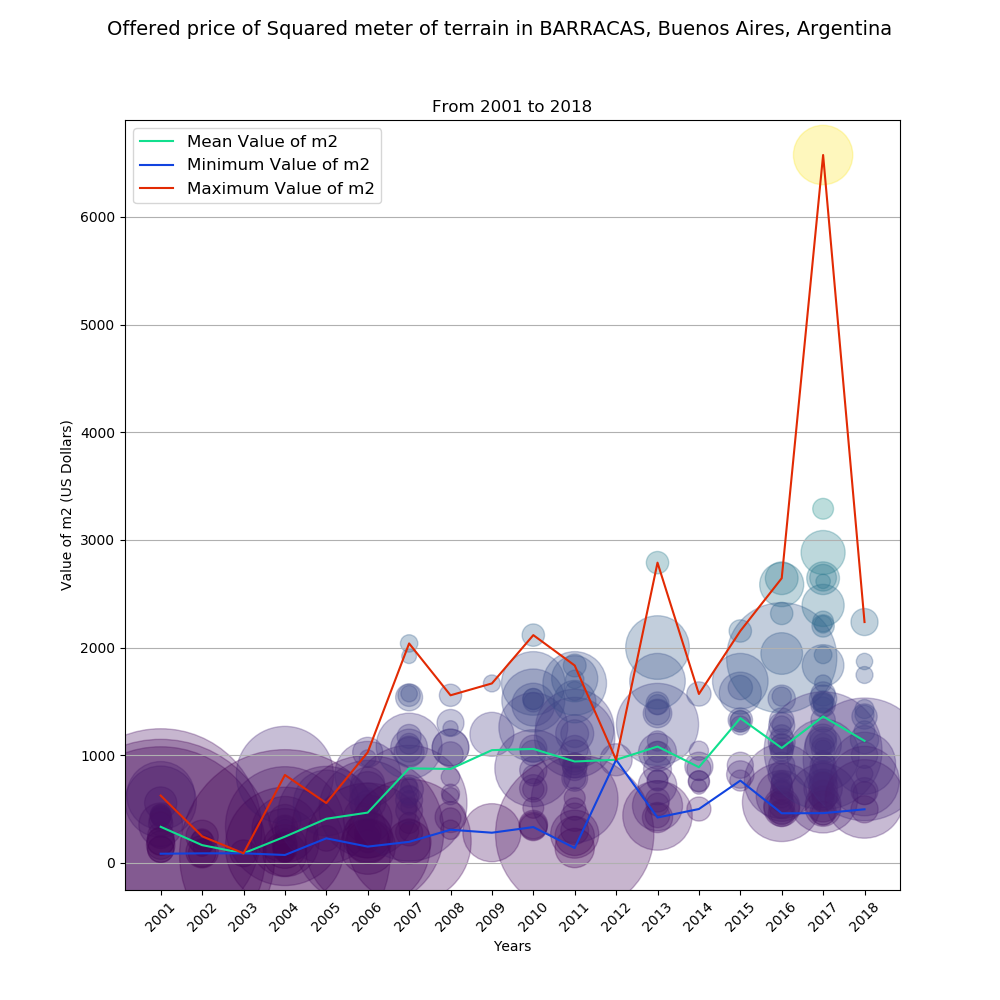

<IPython.core.display.Javascript object>


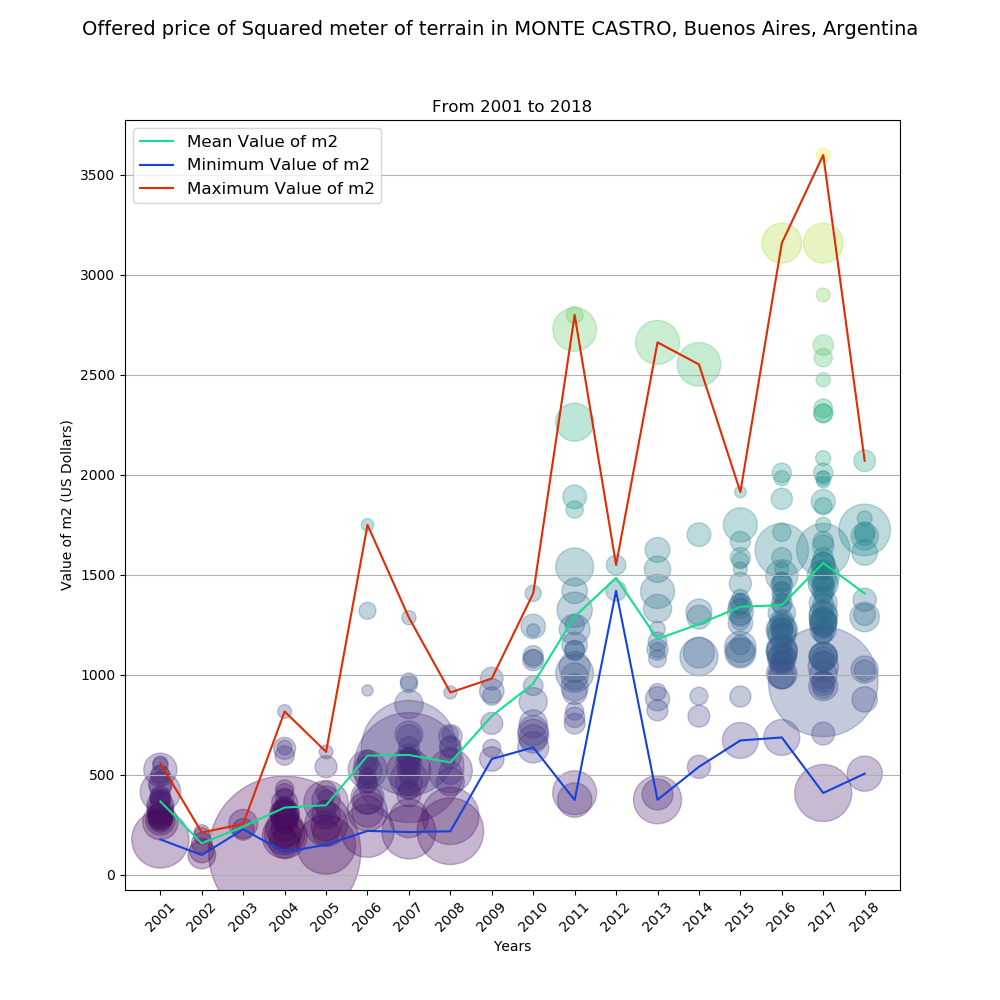

<IPython.core.display.Javascript object>


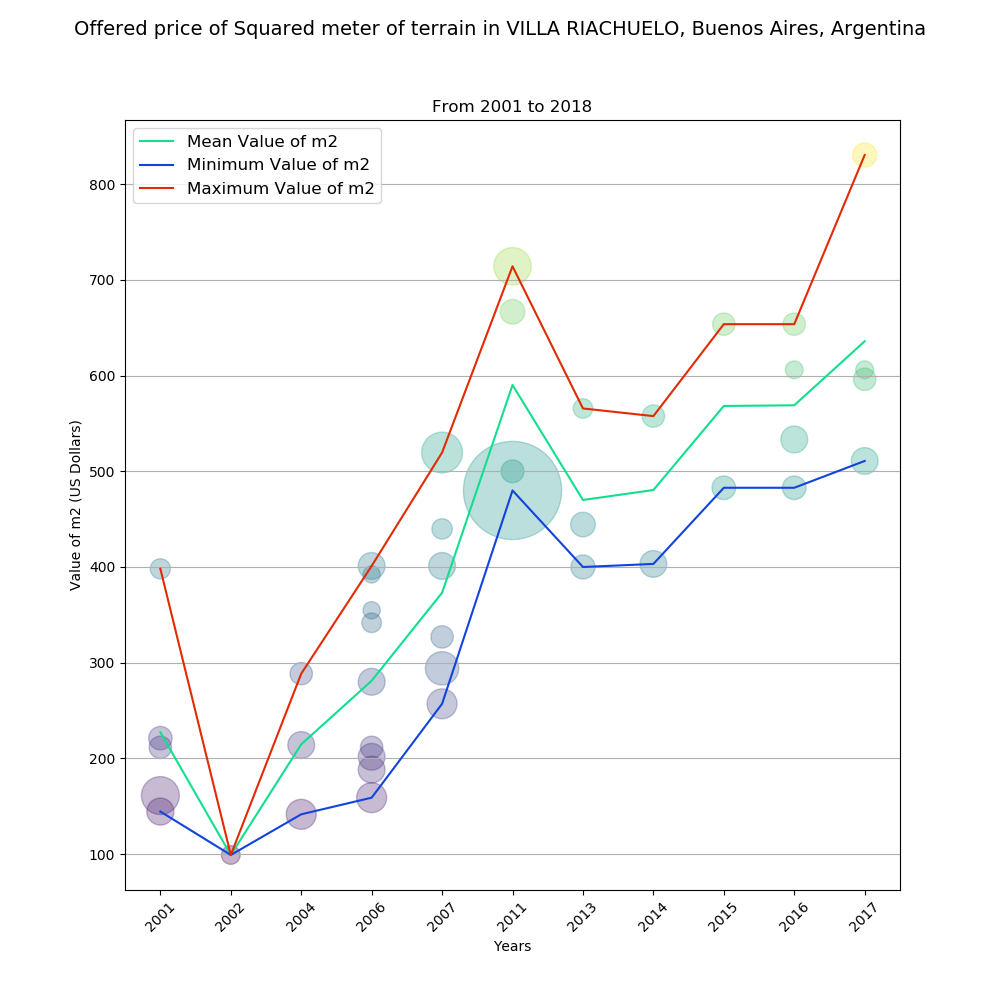

<IPython.core.display.Javascript object>


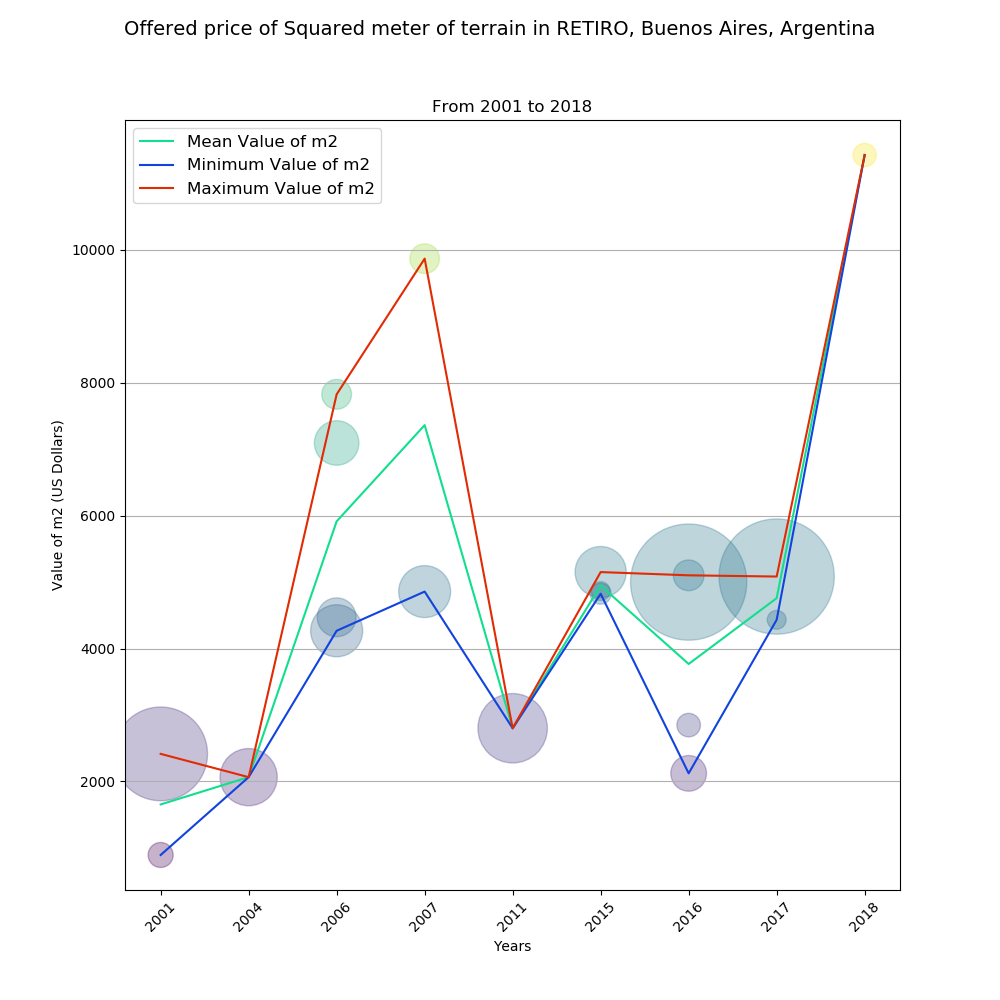

<IPython.core.display.Javascript object>


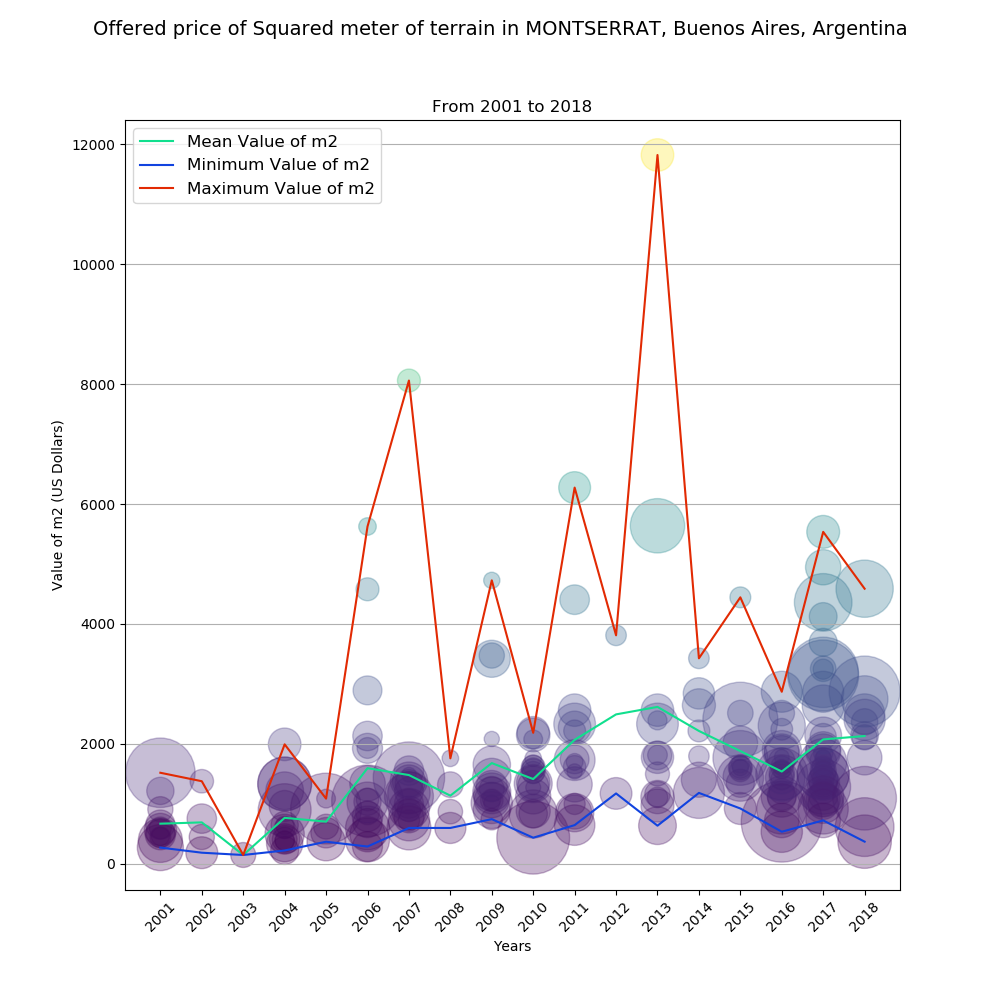

<IPython.core.display.Javascript object>


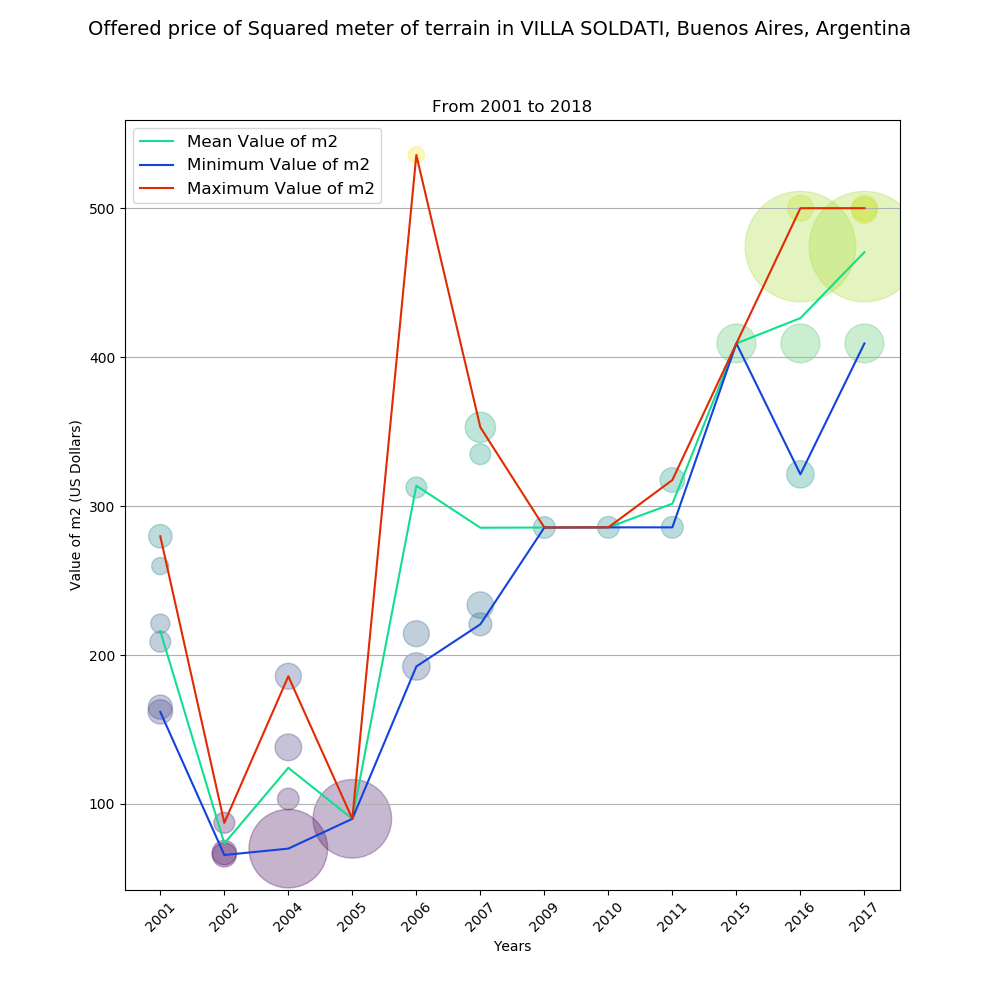

<IPython.core.display.Javascript object>


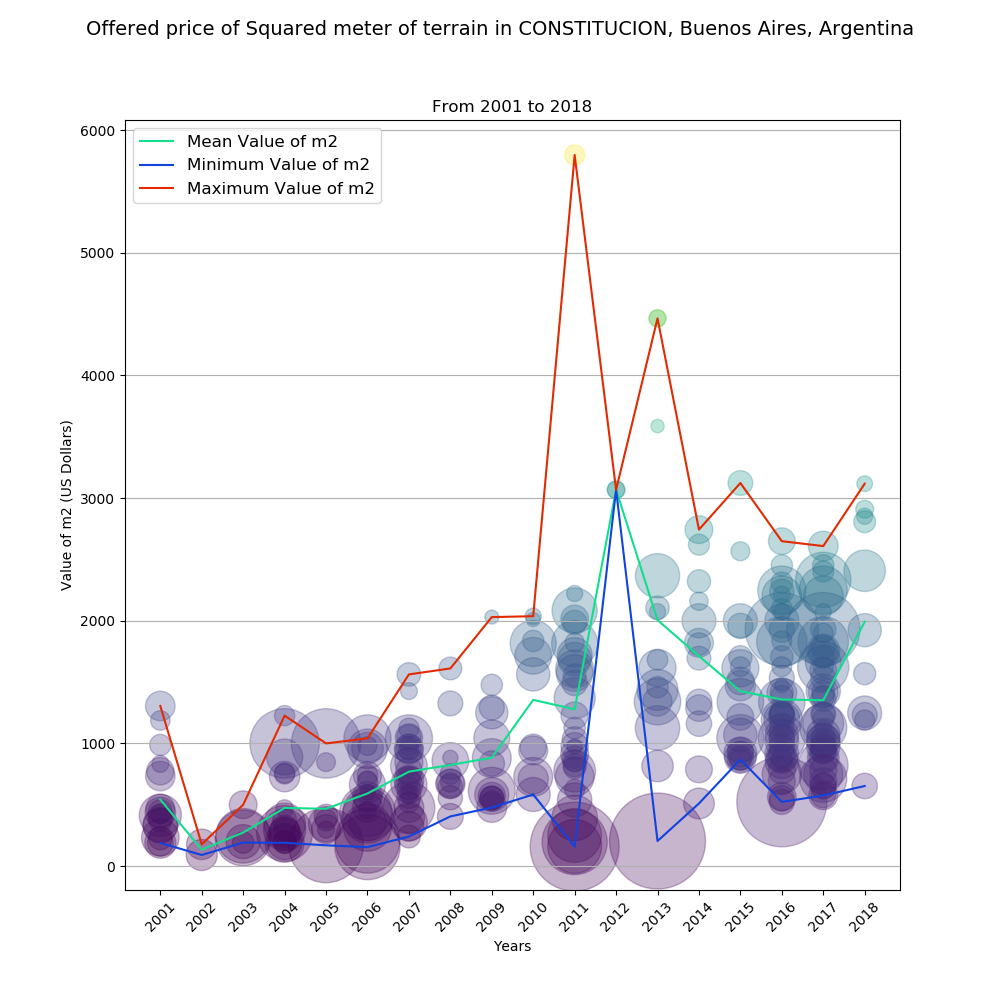

<IPython.core.display.Javascript object>


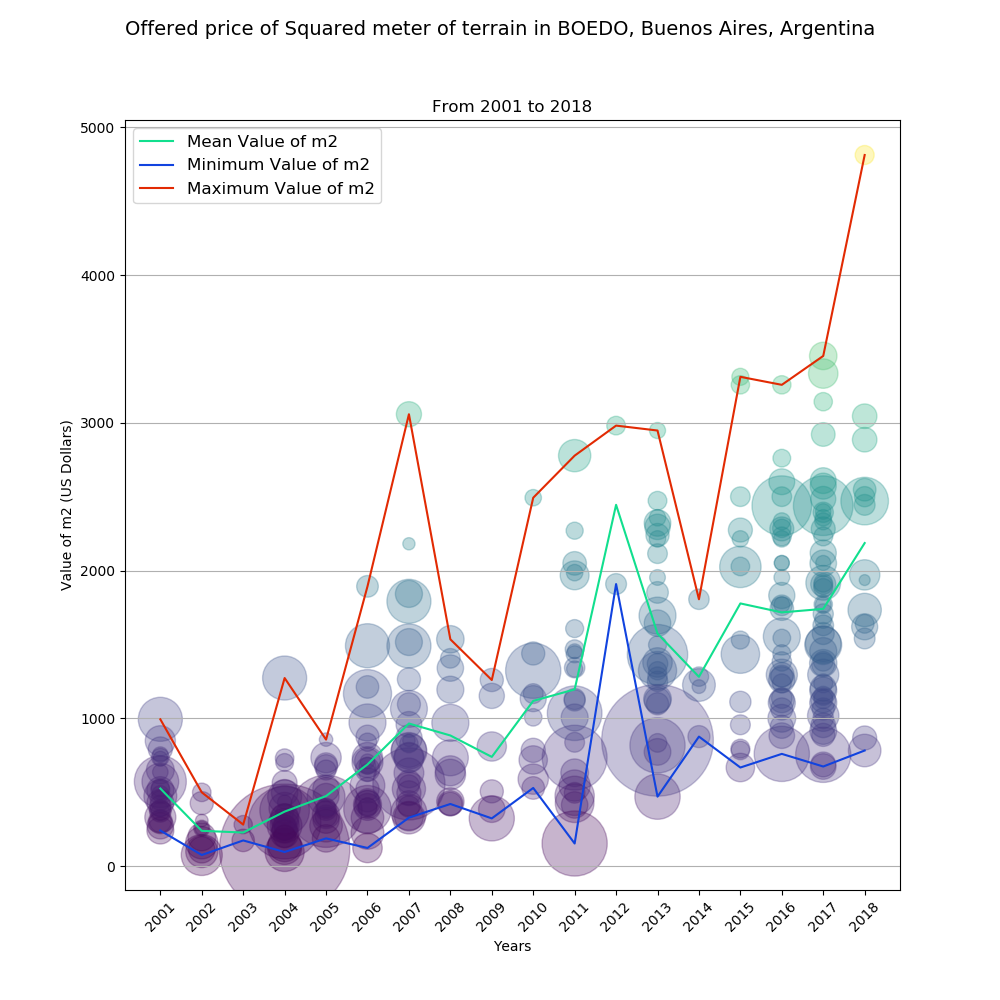

<IPython.core.display.Javascript object>


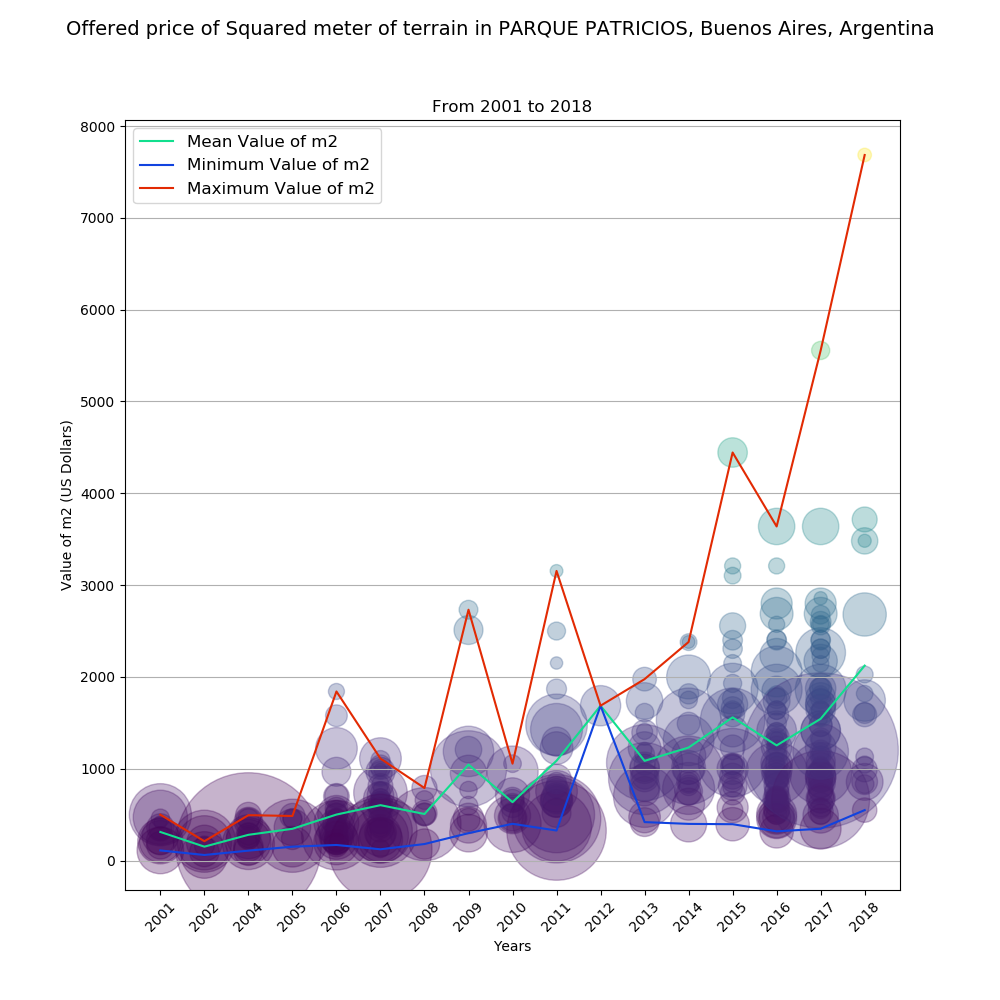

<IPython.core.display.Javascript object>


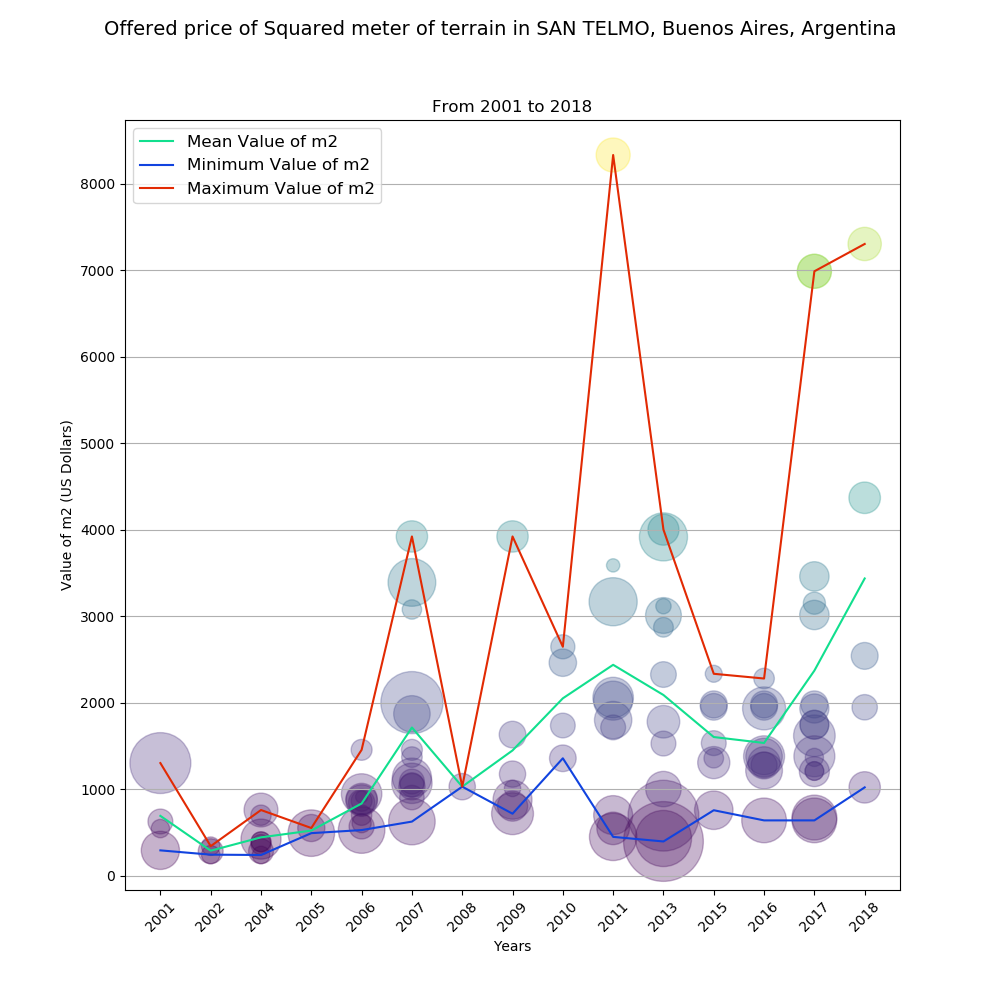

<IPython.core.display.Javascript object>


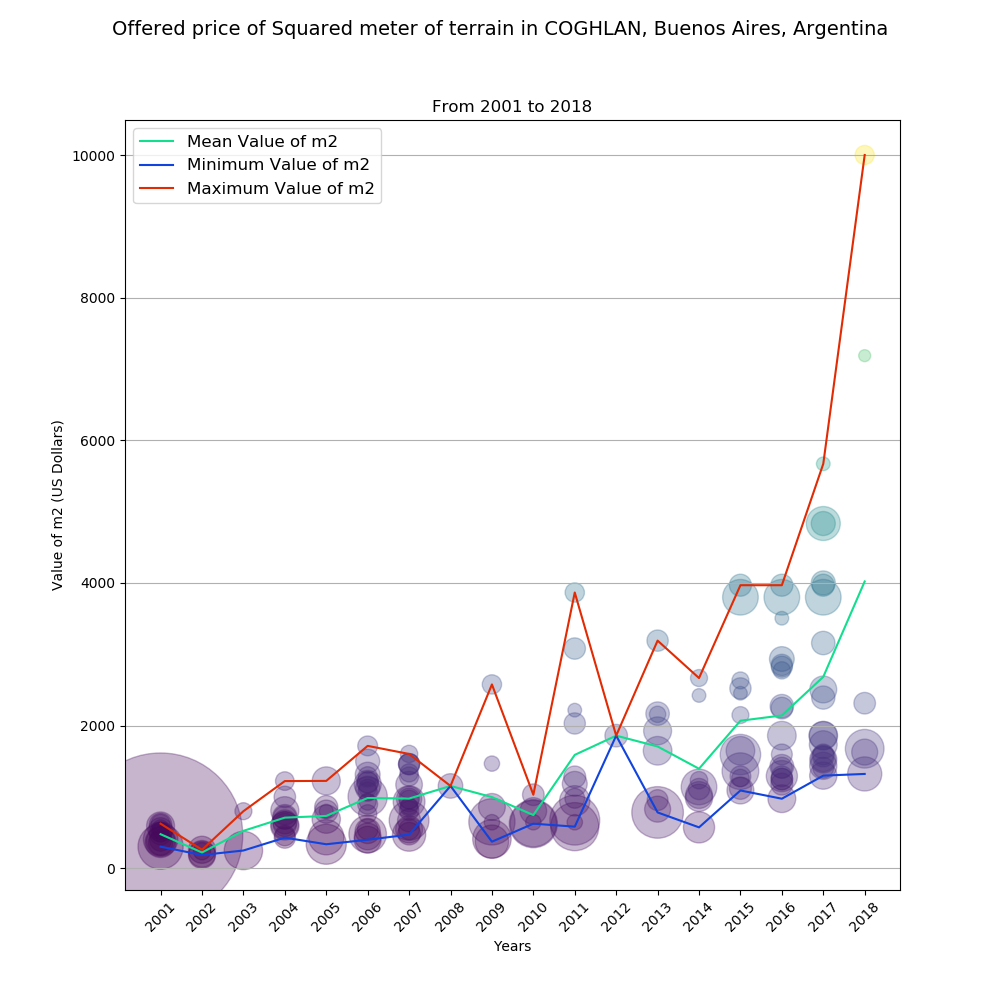

<IPython.core.display.Javascript object>


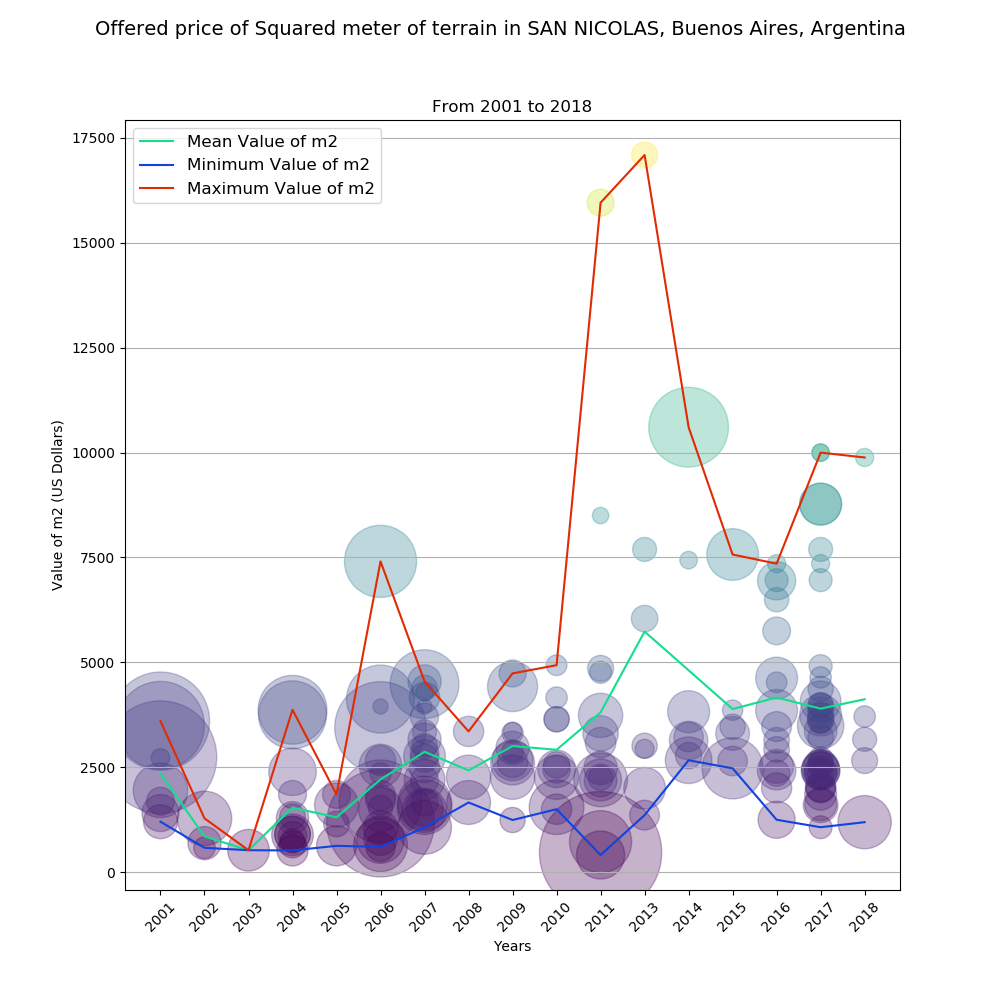

<IPython.core.display.Javascript object>


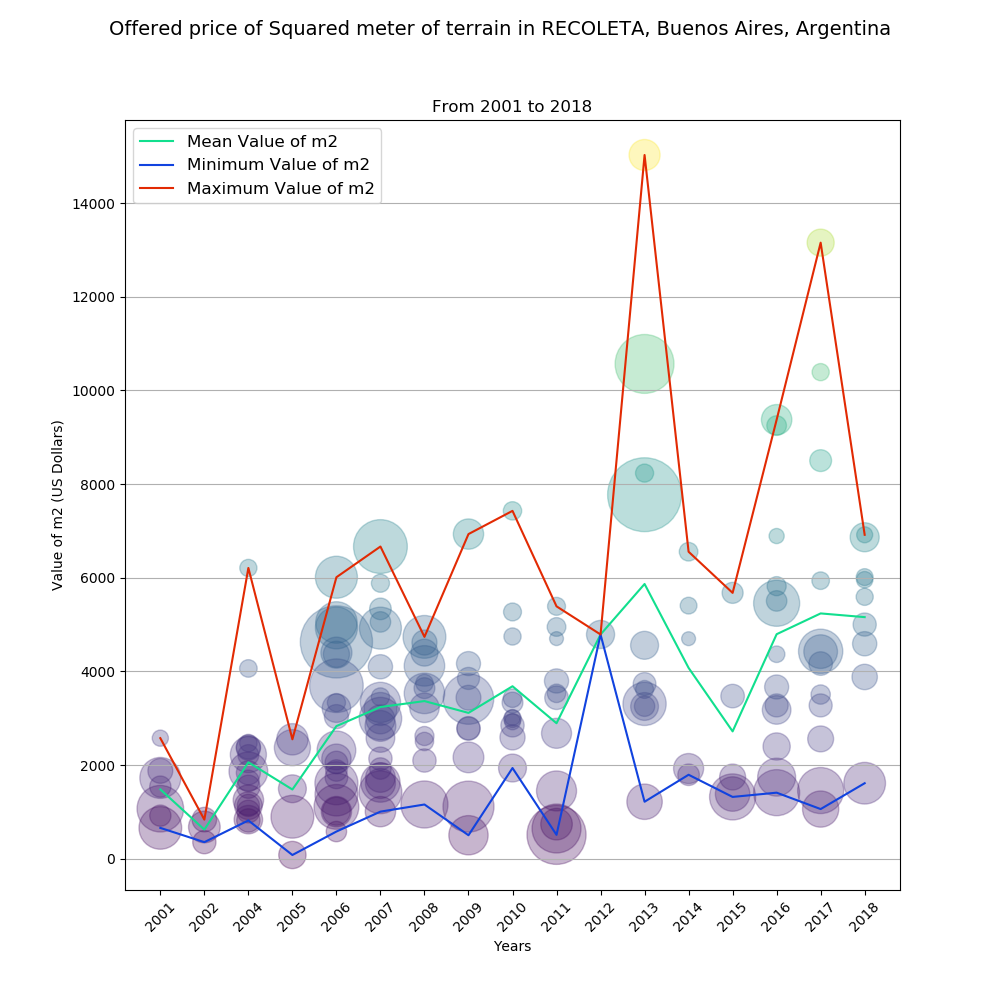

<IPython.core.display.Javascript object>


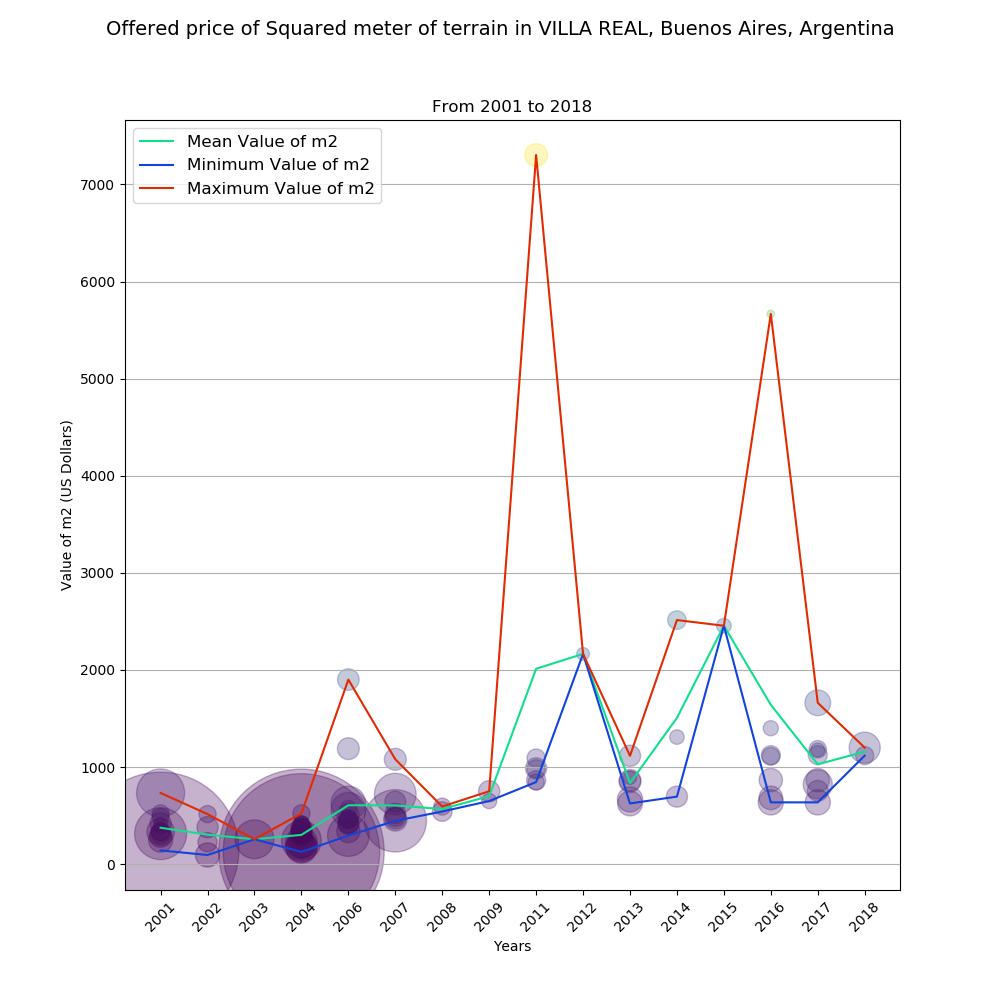

<IPython.core.display.Javascript object>


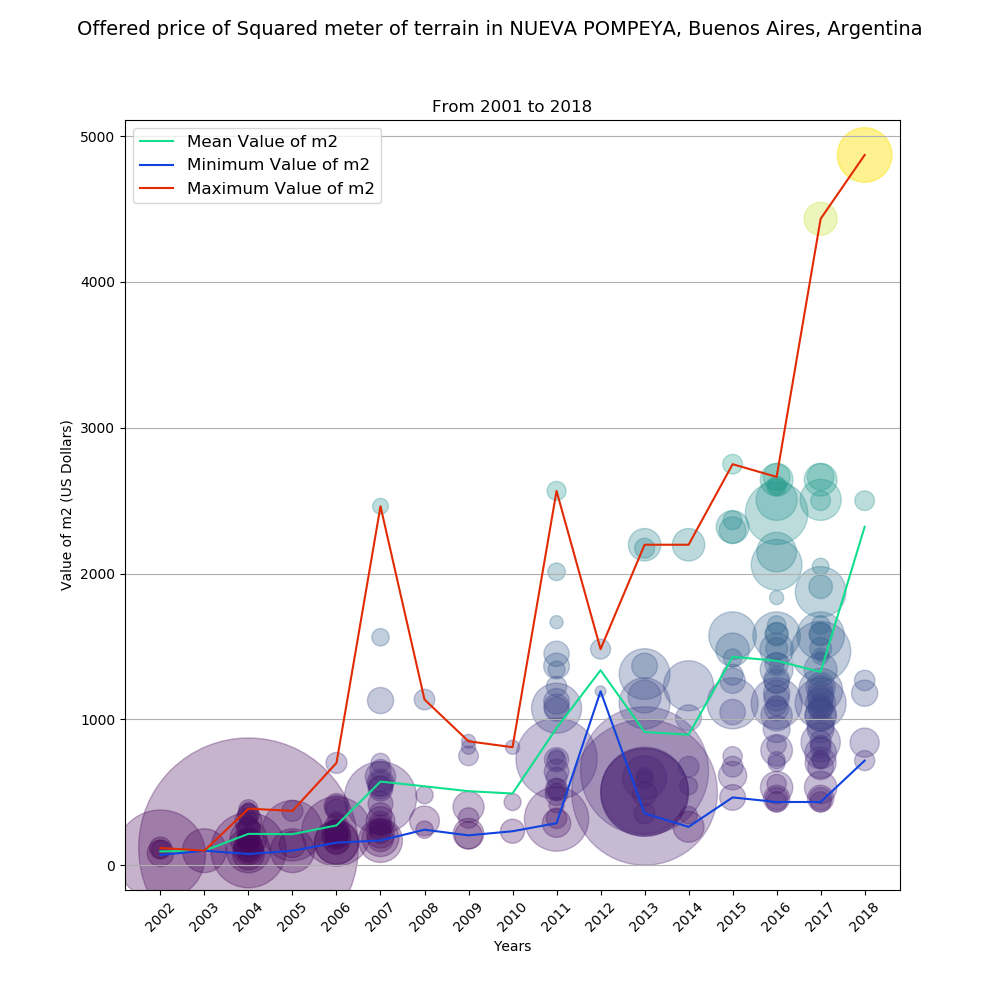

<IPython.core.display.Javascript object>


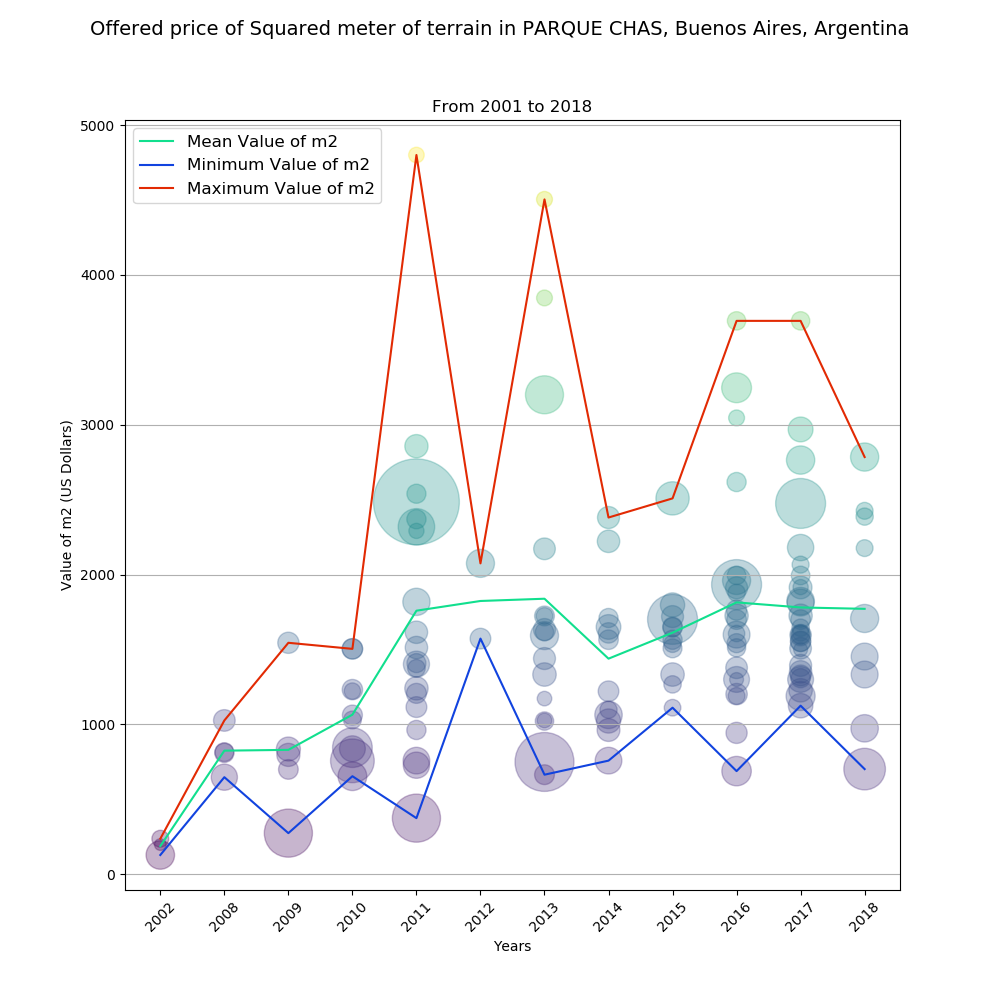

<IPython.core.display.Javascript object>


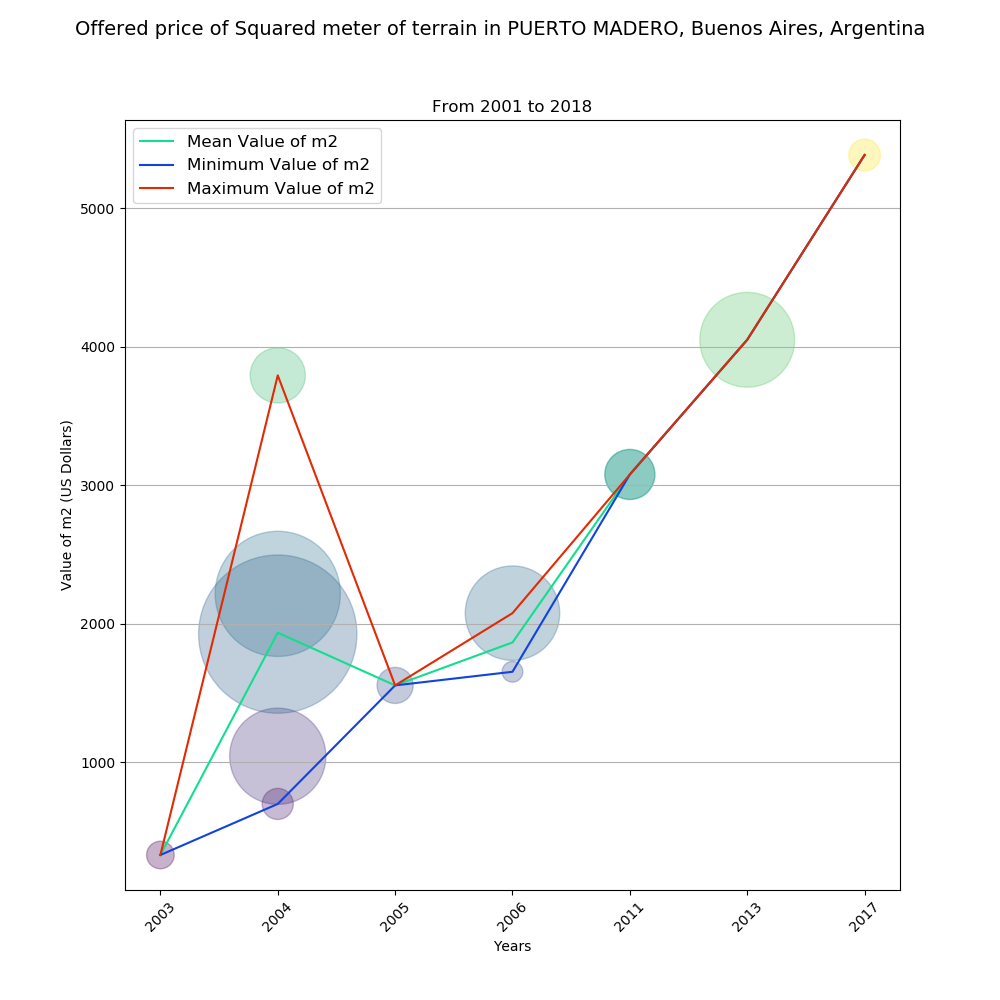

In [96]:
#Let's create a visualization that shows the history for each barrio

for barrio in barrios:
    #set the df after filtering
    barrio_df = filterBarrio(df,barrio)
    #call the create scatter function, passing the filtered DF
    create_scatter_plot(barrio_df,barrio)